# Prediction Housing Prices

The Kaggle competition named "House Prices: Advanced Regression Techniques" asked to predict the price of residential homes in Ames, Iowa.  We were provided a train dataset on which were to train and tune our models along with a test dataset which was used for submission.  This competition asked to utilize advanced machine learning models and topics such as ensemble models along with blending and stacking techniques. 

The original dataset can be found here: https://www.kaggle.com/c/house-prices-advanced-regression-techniques

## <font color='blue'>Instaling Packages</font> 

In [211]:
import six
import sys
sys.modules['sklearn.externals.six'] = six

import math
import pandas as pd 
import numpy as np
import datetime
from scipy import stats
from scipy.stats import skew
from math import sqrt
from scipy.special import boxcox1p, inv_boxcox
from scipy.stats import boxcox_normmax
import scipy.cluster.hierarchy as sch

from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score 

from imblearn.pipeline import make_pipeline
from feature_engine import categorical_encoders as ce

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures
from mlxtend.regressor import StackingRegressor
from mlxtend.regressor import StackingCVRegressor
from hyperopt import fmin, tpe, hp, anneal, Trials
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

from sklearn import svm
from lightgbm import LGBMRegressor
from sklearn.linear_model import ElasticNet
from xgboost import XGBRegressor
from sklearn.linear_model import Lasso
from sklearn.ensemble import RandomForestRegressor

import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.style as style
pd.pandas.set_option('display.max_columns', None)

## <font color='blue'>Reading Data</font> 

The dataset we'll be working with has been already divided for us into train and test.  The training set does contain our target feature "SalePrice".  We'll also be loading the "sample_submission" dataset to get an idea what our submission to the competition will need to look like. 

In [3]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')
y = train['SalePrice']
sub_data = pd.read_csv('sample_submission.csv')

In [4]:
train.shape, test.shape

((1460, 81), (1459, 80))

In [6]:
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [7]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

Train and test datasets have an equal amount of observations, however, the train dataset has an extra feature "SalePrice" which is our target.

In [239]:
test_id = test['Id']
test_id

0       1461
1       1462
2       1463
3       1464
4       1465
        ... 
1454    2915
1455    2916
1456    2917
1457    2918
1458    2919
Name: Id, Length: 1459, dtype: int64

By taking a quick glance at the data and reading the data descriptions for each feature we can see that some feature values need to some initial converting. Specifically, we need to convert the values of some features from string to numeric or ordinal to be exact (ie. label encoding). For example, 'ExterQual' has the values of Ex, Gd, TA, Fa and Po which correspond to "Excellent", "Good", "Typical", "Fair" and "Poor".  We can convert these string values to numerical such as 5, 4, 3, 2, 1.  This way we have a numerical representation of quality which our model can identify.  

This will be done for both train and test datasets.


In [8]:
train['ExterQual'].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1}, inplace=True)
train['ExterCond'].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1}, inplace=True)
train['BsmtQual'].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1, 'None':0}, inplace=True)
train['BsmtCond'].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1, 'None':0}, inplace=True)
train['BsmtExposure'].replace({'Gd':3, 'Av':2, 'Mn':1, 'No':0, 'Na':0}, inplace=True)
train['BsmtFinType1'].replace({'GLQ':6, 'ALQ':5, 'BLQ':4, 'Rec':3, 'LwQ':2, 'Unf':1, 'None':0}, inplace=True)
train['BsmtFinType2'].replace({'GLQ':6, 'ALQ':5, 'BLQ':4, 'Rec':3, 'LwQ':2, 'Unf':1, 'None':0}, inplace=True)
train['HeatingQC'].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1, 'None':0}, inplace=True)
train['KitchenQual'].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1, 'None':0}, inplace=True)
train['FireplaceQu'].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1, 'None':0}, inplace=True)
train['GarageFinish'].replace({'Fin':3, 'RFn':2, 'Unf':1, 'None':0}, inplace=True)
train['GarageQual'].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1}, inplace=True)
train['GarageCond'].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1}, inplace=True)
train['MoSold'].replace({1:'Jan', 2:'Feb', 3:'Mar', 4:'Apr', 5:'May', 6:'Jun', 7:'Jul', 8:'Aug',
                             9:'Sept', 10:'Oct', 11:'Nov', 12:'Dec'}, inplace=True)

In [9]:
test['ExterQual'].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1}, inplace=True)
test['ExterCond'].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1}, inplace=True)
test['BsmtQual'].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1, 'None':0}, inplace=True)
test['BsmtCond'].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1, 'None':0}, inplace=True)
test['BsmtExposure'].replace({'Gd':3, 'Av':2, 'Mn':1, 'No':0, 'Na':0}, inplace=True)
test['BsmtFinType1'].replace({'GLQ':6, 'ALQ':5, 'BLQ':4, 'Rec':3, 'LwQ':2, 'Unf':1, 'None':0}, inplace=True)
test['BsmtFinType2'].replace({'GLQ':6, 'ALQ':5, 'BLQ':4, 'Rec':3, 'LwQ':2, 'Unf':1, 'None':0}, inplace=True)
test['HeatingQC'].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1, 'None':0}, inplace=True)
test['KitchenQual'].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1, 'None':0}, inplace=True)
test['FireplaceQu'].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1, 'None':0}, inplace=True)
test['GarageFinish'].replace({'Fin':3, 'RFn':2, 'Unf':1, 'None':0}, inplace=True)
test['GarageQual'].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1}, inplace=True)
test['GarageCond'].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1}, inplace=True)
test['MoSold'].replace({1:'Jan', 2:'Feb', 3:'Mar', 4:'Apr', 5:'May', 6:'Jun', 7:'Jul', 8:'Aug',
                             9:'Sept', 10:'Oct', 11:'Nov', 12:'Dec'}, inplace=True)

It seems the MSSubClass feature has been miscoded as many of the numerical values do not align with the definition provided in the code book.  

In [10]:
conditions = [
    (train['BldgType'] == '1Fam') & (train['HouseStyle'] == '1Story') & (train['YearBuilt'] >= 1946) & (train['MSSubClass'] != 40),
    (train['BldgType'] == '1Fam') & (train['HouseStyle'] == '1Story') & (train['YearBuilt'] < 1946) & (train['MSSubClass'] != 40),
    (train['BldgType'] == '1Fam') & (train['HouseStyle'] == '1.5Unf'),
    (train['BldgType'] == '1Fam') & (train['HouseStyle'] == '1.5Fin'),
    (train['BldgType'] == '1Fam') & (train['HouseStyle'] == '2Story') & (train['YearBuilt'] >= 1946),
    (train['BldgType'] == '1Fam') & (train['HouseStyle'] == '2Story') & (train['YearBuilt'] < 1946),
    (train['BldgType'] == '1Fam') & (train['HouseStyle'] == '2.5Unf') | (train['HouseStyle'] == '2.5Fin'),
    (train['BldgType'] == '1Fam') & (train['HouseStyle'] == 'SLvl'),
    (train['BldgType'] == '1Fam') & (train['HouseStyle'] == 'SFoyer'),
    (train['BldgType'] == 'Duplex'),
    (train['BldgType'] == 'Twnhs') | (train['BldgType'] == 'TwnhsE') & (train['HouseStyle'] == '1Story') & (train['YearBuilt'] >= 1946),
    (train['BldgType'] == 'Twnhs') | (train['BldgType'] == 'TwnhsE') & (train['HouseStyle'] == '1.5Fin') | (train['HouseStyle'] == '1.5Unf'),
    (train['BldgType'] == 'Twnhs') | (train['BldgType'] == 'TwnhsE') & (train['HouseStyle'] == '2Story') & (train['YearBuilt'] >= 1946),
    (train['BldgType'] == 'Twnhs') | (train['BldgType'] == 'TwnhsE') & (train['HouseStyle'] == 'SLvl') | (train['HouseStyle'] == 'SFoyer') & (train['YearBuilt'] >= 1946),
    (train['BldgType'] == '2fmCon')]

values = [20, 30, 45, 50, 60, 70, 75, 80, 85, 90, 120, 150, 160, 180, 190]

train['MSSubClass_fix'] = np.select(conditions, values)
        

In [11]:
conditions = [
    (test['BldgType'] == '1Fam') & (test['HouseStyle'] == '1Story') & (test['YearBuilt'] >= 1946) & (test['MSSubClass'] != 40),
    (test['BldgType'] == '1Fam') & (test['HouseStyle'] == '1Story') & (test['YearBuilt'] < 1946) & (test['MSSubClass'] != 40),
    (test['BldgType'] == '1Fam') & (test['HouseStyle'] == '1.5Unf'),
    (test['BldgType'] == '1Fam') & (test['HouseStyle'] == '1.5Fin'),
    (test['BldgType'] == '1Fam') & (test['HouseStyle'] == '2Story') & (test['YearBuilt'] >= 1946),
    (test['BldgType'] == '1Fam') & (test['HouseStyle'] == '2Story') & (test['YearBuilt'] < 1946),
    (test['BldgType'] == '1Fam') & (test['HouseStyle'] == '2.5Unf') | (test['HouseStyle'] == '2.5Fin'),
    (test['BldgType'] == '1Fam') & (test['HouseStyle'] == 'SLvl'),
    (test['BldgType'] == '1Fam') & (test['HouseStyle'] == 'SFoyer'),
    (test['BldgType'] == 'Duplex'),
    (test['BldgType'] == 'Twnhs') | (test['BldgType'] == 'TwnhsE') & (test['HouseStyle'] == '1Story') & (test['YearBuilt'] >= 1946),
    (test['BldgType'] == 'Twnhs') | (test['BldgType'] == 'TwnhsE') & (test['HouseStyle'] == '1.5Fin') | (test['HouseStyle'] == '1.5Unf'),
    (test['BldgType'] == 'Twnhs') | (test['BldgType'] == 'TwnhsE') & (test['HouseStyle'] == '2Story') & (test['YearBuilt'] >= 1946),
    (test['BldgType'] == 'Twnhs') | (test['BldgType'] == 'TwnhsE') & (test['HouseStyle'] == 'SLvl') | (test['HouseStyle'] == 'SFoyer') & (test['YearBuilt'] >= 1946),
    (test['BldgType'] == '2fmCon')]

values = [20, 30, 45, 50, 60, 70, 75, 80, 85, 90, 120, 150, 160, 180, 190]

test['MSSubClass_fix'] = np.select(conditions, values)

Finally, we need to cast MSSubClass_fix as a categorical feature as the numerical values do not represent any ordinal relationships.

In [12]:
for i in [0, 20, 30, 45, 50, 60, 70, 75, 80, 85, 90, 120, 150, 160, 180, 190]:
    train['MSSubClass_fix'].replace({i:'str' + str(i)}, inplace=True)

for i in [0, 20, 30, 45, 50, 60, 70, 75, 80, 85, 90, 120, 150, 160, 180, 190]:
    test['MSSubClass_fix'].replace({i:'str' + str(i)}, inplace=True)
    
train.drop('MSSubClass', axis=1, inplace=True)   
test.drop('MSSubClass', axis=1, inplace=True) 

# <font color='blue'>Exploratory Data Analysis</font> 

## <font color='blue'>Visualizations</font> 
Now that we have done some initial data cleaning by correcting feature values we can take a closer look at our data.  Humans are visual beings by nature and we love to see pretty pictures.  What better way to examine our features and their interdependencies then by putting matplotlib and seaborn to work for us. 

### <font color='orange'>Target (SalePrice)</font> 

(array([0.e+00, 1.e-06, 2.e-06, 3.e-06, 4.e-06, 5.e-06, 6.e-06, 7.e-06,
        8.e-06, 9.e-06]),
 <a list of 10 Text yticklabel objects>)

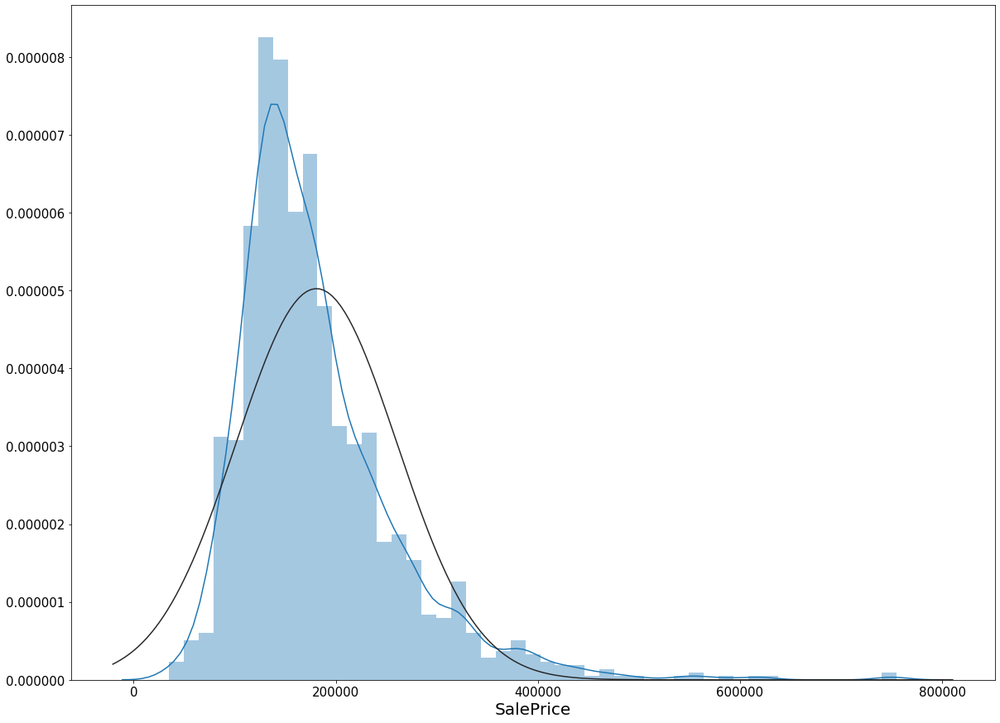

In [17]:
plt.figure(figsize=(20,15))
sns.distplot(train['SalePrice'], fit=stats.norm)
plt.xlabel('SalePrice', fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

((array([-3.30513952, -3.04793228, -2.90489705, ...,  2.90489705,
          3.04793228,  3.30513952]),
  array([ 34900,  35311,  37900, ..., 625000, 745000, 755000])),
 (74160.16474519414, 180921.19589041095, 0.9319665641512983))

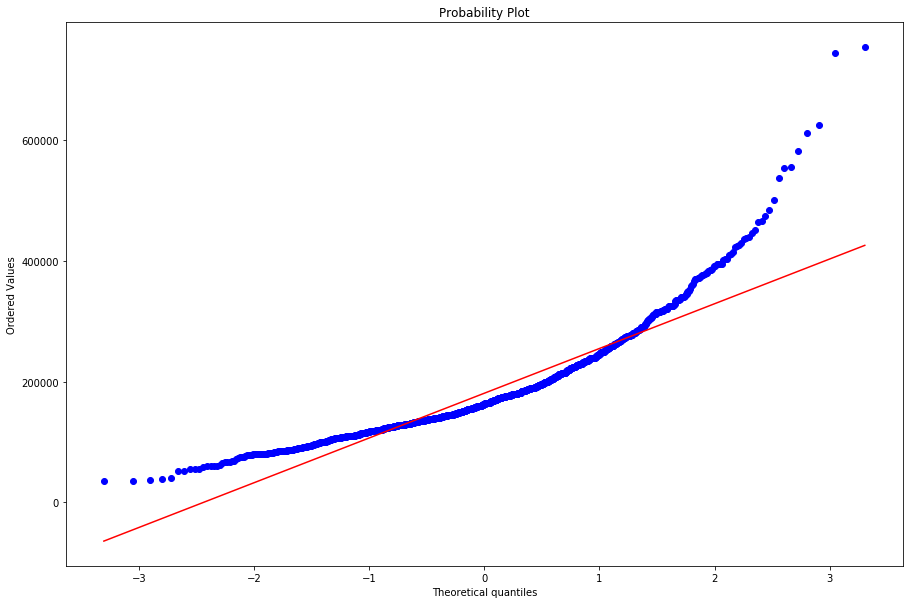

In [18]:
plt.figure(figsize=(15,10))
stats.probplot(train['SalePrice'], plot=plt)

Starting with out target, we can see that it has a skew distribution.  Many models do make a normality assumption and a skewed target could negatively impact the performance of our model(s).

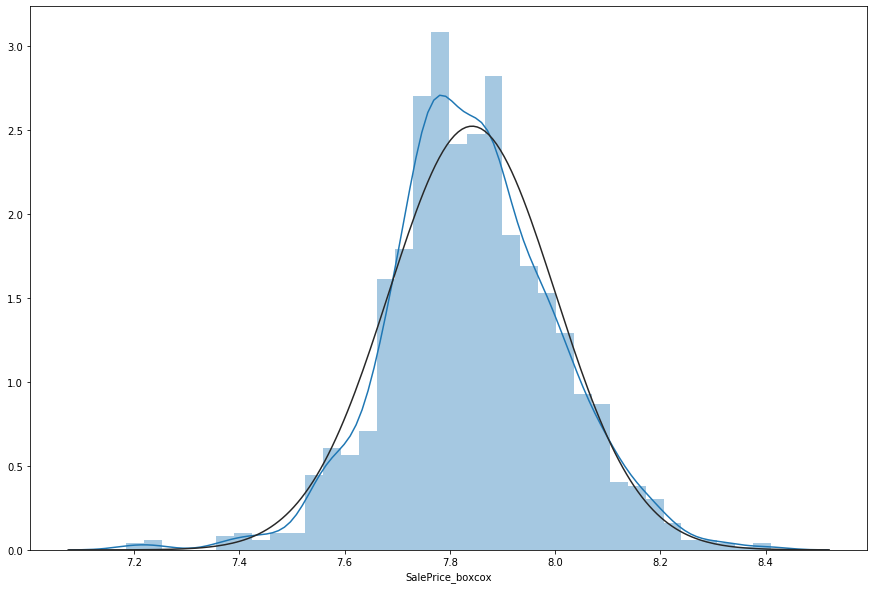

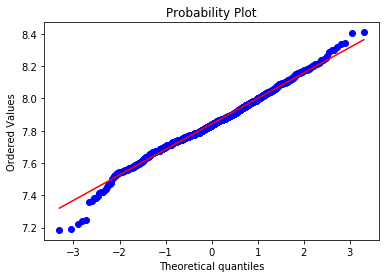

In [26]:
plt.figure(figsize=(15,10))
#y = y.to_frame()
y['SalePrice_boxcox'], param = stats.boxcox(y['SalePrice'])

sns.distplot(y['SalePrice_boxcox'], fit=stats.norm);
fig = plt.figure()
res = stats.probplot(y['SalePrice_boxcox'], plot=plt)

In [27]:
for col in y.columns:
    print(col, y[col].skew())

SalePrice 1.8828757597682129
SalePrice_boxcox -0.008652893640830005


In [28]:
print(param)

-0.07692391328663316


After going through a number of transformations (ie. log, log1p, sqrt, boxcox, etc.) we can see that the boxcox transformation has performed best.  We have also printed the lambda parameter which we'll need to perform the invert boxcox calculation prior to submitting our results. 

## <font color='orange'>Numerical Features</font> 
Let's examine our numeric (ordinal and continuous) features.  We are specifically looking for their relationships with the target and their relationships amoung each other.

In [29]:
num_feats = train.select_dtypes(exclude='object').columns
num_feats

Index(['Id', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'ExterQual', 'ExterCond',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'HeatingQC',
       '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath',
       'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
       'KitchenQual', 'TotRmsAbvGrd', 'Fireplaces', 'FireplaceQu',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'ScreenPorch', 'PoolArea', 'MiscVal', 'YrSold', 'SalePrice'],
      dtype='object')

In [33]:
def cluster_corr(corr_array, inplace=False):
    pairwise_distances = sch.distance.pdist(corr_array)
    linkage = sch.linkage(pairwise_distances, method='complete')
    cluster_distance_threshold = pairwise_distances.max()/2
    idx_to_cluster_array = sch.fcluster(linkage, cluster_distance_threshold, 
                                        criterion='distance')
    idx = np.argsort(idx_to_cluster_array)
    
    if not inplace:
        corr_array = corr_array.copy()
    
    if isinstance(corr_array, pd.DataFrame):
        return corr_array.iloc[idx, :].T.iloc[idx, :]
    return corr_array[idx, :][:, idx]

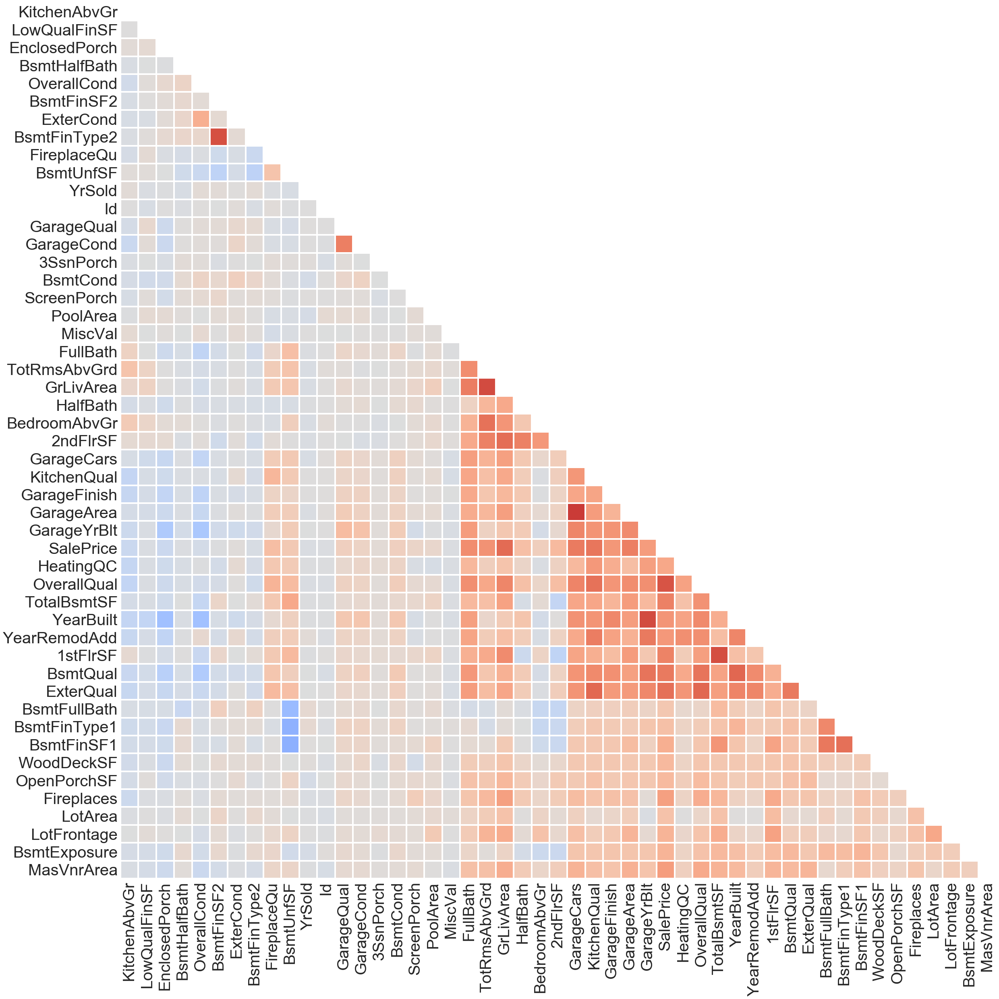

In [34]:
correlation = train[num_feats].corr()
mask = np.zeros_like(correlation, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
plt.figure(figsize=(70,40))
plt.xticks(fontsize=40)
plt.yticks(fontsize=40)
sns.set_style('whitegrid')
sns.heatmap(cluster_corr(train[num_feats].corr()),
           cmap='coolwarm',
            fmt=".2f",
            cbar=False,
            linewidths=3, 
            vmin=-1, 
            mask=mask,
           center=0,
           square=True)

Correlation heatmaps are sometimes difficult to decypher, especially when you have too many features.  By applying a little bit of logic we have grouped the highly correlated features together in order to make interpretability a bit easier.

Let's first examine the features which correlate the highest with our target.

Furthermore, by looking at the correlation matrix we can see that those features which correlate highly with "SalePrice" also correlate highly together.  Therefore, if we were to examine multivariate relationships (ie. more than 2 features) between the target and two other features we can expect a positive relationship.  This will be examined below. 

In [35]:
target_corr = abs(correlation['SalePrice']).where(lambda x: x >= 0.5).dropna().sort_values(kind="quicksort")
target_corr

YearRemodAdd    0.507101
GarageFinish    0.513105
YearBuilt       0.522897
TotRmsAbvGrd    0.533723
FullBath        0.560664
1stFlrSF        0.605852
TotalBsmtSF     0.613581
GarageArea      0.623431
GarageCars      0.640409
BsmtQual        0.644019
KitchenQual     0.659600
ExterQual       0.682639
GrLivArea       0.708624
OverallQual     0.790982
SalePrice       1.000000
Name: SalePrice, dtype: float64

Here are the features which have high correlations with our target.

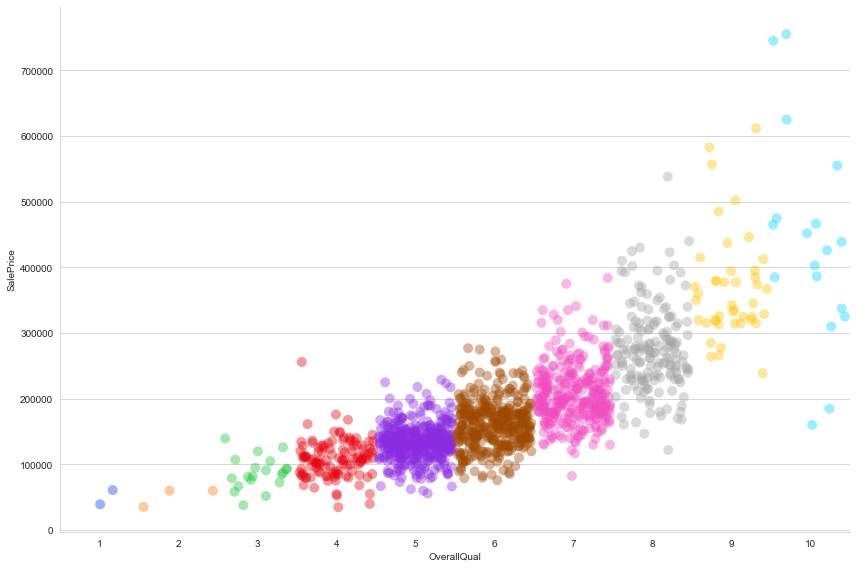

In [36]:
sns.set_style('whitegrid')
sns.catplot(data=train, x='OverallQual', y='SalePrice', 
                jitter=.47, s=10, alpha=0.4, height=8, aspect=1.5, palette='bright')

First, we can confirm the positive relationship between SalePrice and OverallQual of the house.  The majority of homes are between 5, 6 and 7 OverallQual all of which correspond with an increase in SalePrice.  We are seeing some potential outliers, particularly for homes which have a 10 OverallQual rating but a SalePrice below $200,000.  

Text(0.5, 1.0, 'Ground Floor Living Area by Sale Price')

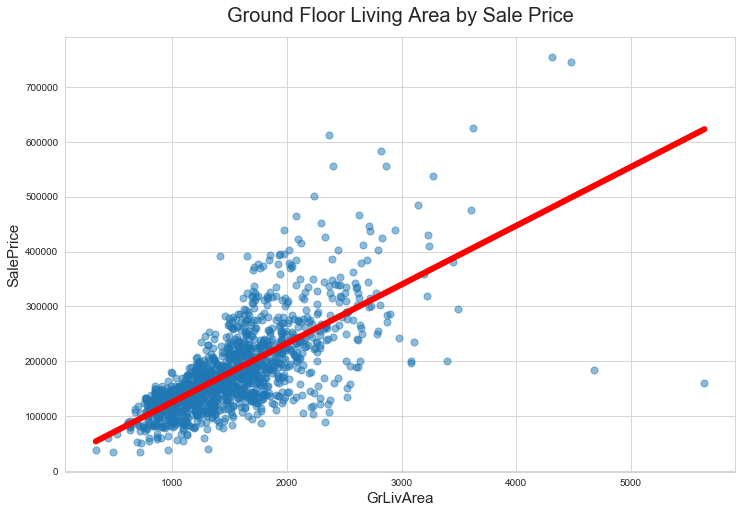

In [72]:
plt.figure(figsize=(12,8))
sns.regplot(data=train, x='GrLivArea', y='SalePrice', scatter_kws={"s": 50, 'alpha':0.5}, 
             ci=None, line_kws = {'color': 'red', 'lw':6})
plt.xlabel('GrLivArea', fontsize=15)
plt.ylabel('SalePrice', fontsize=15)
plt.title('Ground Floor Living Area by Sale Price', fontsize=20, pad=15)

It seems that GrLivArea and SalePrice has a relatively linear relationship but as the GrLivArea begins to increase, the relationship begins to erode.  It would seem that GrLivArea for home between 0 and 1500 is a very good predictor of SalePrice.  However, as the GrLivArea beings to increase the home value becomes more distributed into things such as total SF, number of garages, number of bathrooms, etc. This would make logical sense as buyers looking for relatively inexpensive homes are much more willing to sacrifice number of garages, backyard space in favor for living square footage.  

Furthermore, the author of the study recommends that we remove any homes with more than 4000 square feet.

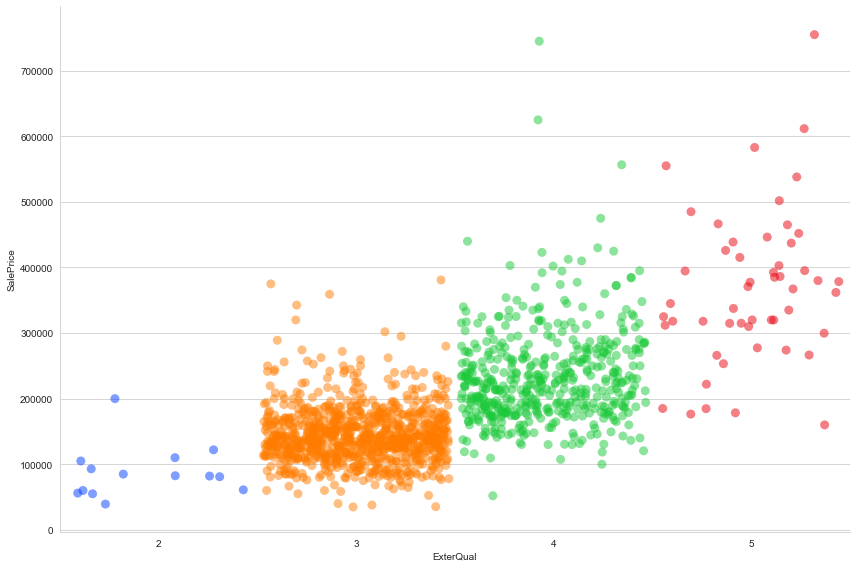

In [49]:
sns.catplot(data=train, x='ExterQual', y='SalePrice', 
                jitter=.47, s=9, alpha=0.5, height=8, aspect=1.5, palette='bright')

ExterQual seems to have a linear relationship with SalePrice as the home price seems to generally increase with an increase in ExterQual. Once again we are seeing outliers which we might have to remove in order to increase the robustness of the relationship b/w SalePrice and ExterQual. 

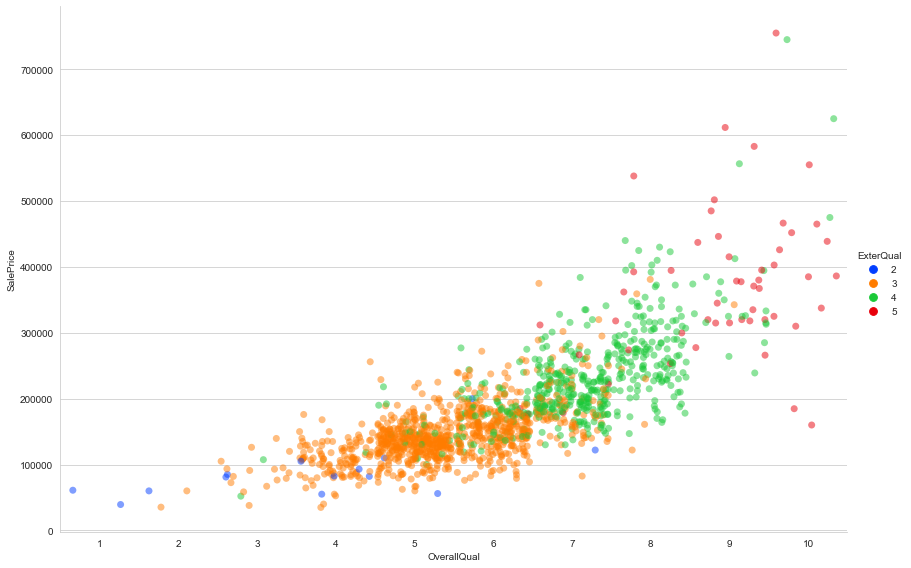

In [50]:
sns.catplot(data=train, x='OverallQual', y='SalePrice', 
                hue='ExterQual', jitter=0.47, s=7, alpha=0.5, height=8, aspect=1.5, palette='bright')

By looking at the multivate relationship between SalePrice and OverallQual/ExterQual we can see a familiar trend.  It seems homes with a high OverallQual also have a high ExterQual and vice versa.

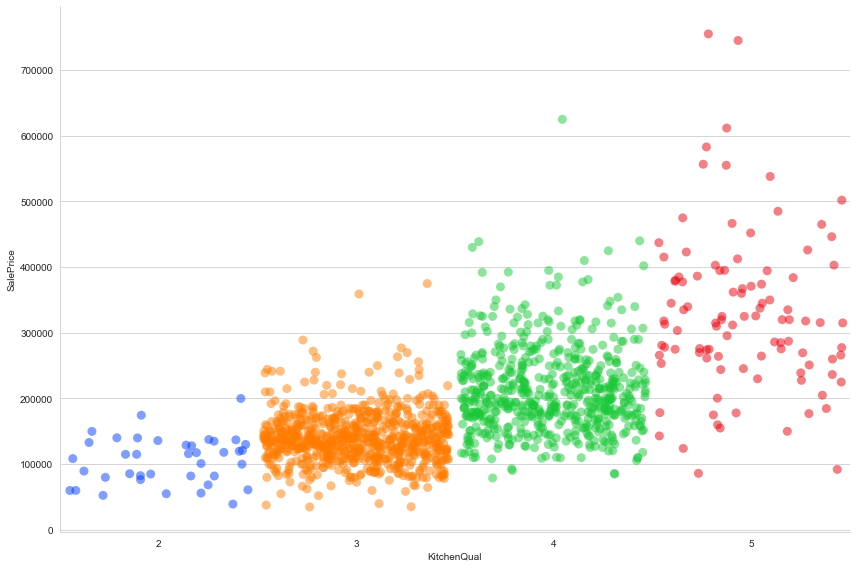

In [51]:
sns.catplot(data=train, x='KitchenQual', y='SalePrice', 
                jitter=.47, s=9, alpha=0.5, height=8, aspect=1.5, palette='bright')

The relationship between KitchenQual and SalePrice is as expected. However, kitchens rated as 5 do have a wide range of home prices.  It would seem that very high quality kitchens can be found in relatively inexpensive and very expensive homes. In today's modern home designs this trend makes sense.  The kitchen has become one of the main areas where family members congregate and one of the main selling points of a home.  A potential home buyer will remember a home with a spectacular kitchen compared to a well finished bedroom. Let's examine try and validate this assumption by looking at the year of last remodel.  

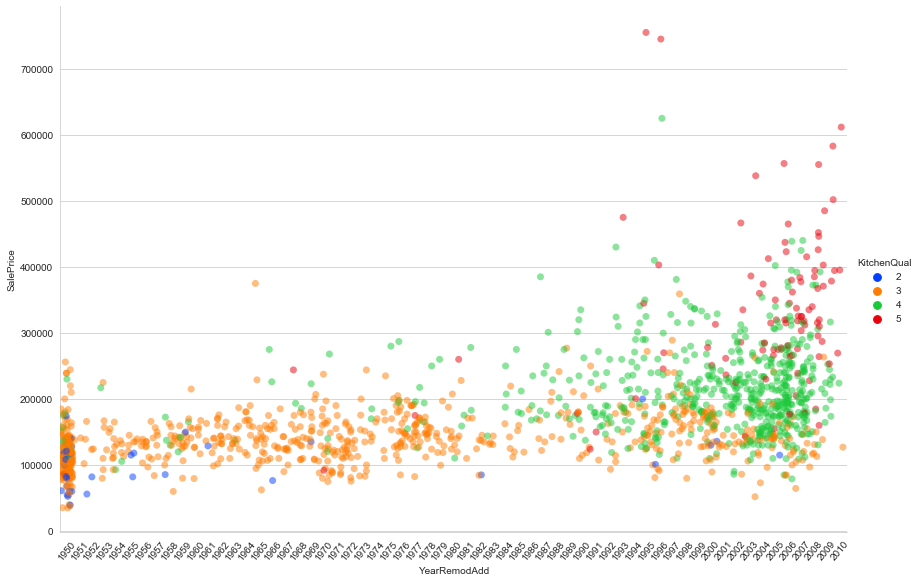

In [52]:
g = sns.catplot(data=train, x='YearRemodAdd', y='SalePrice', 
            hue='KitchenQual', jitter=0.47, s=7, alpha=0.5, 
            height=8, aspect=1.5, palette='bright')
g.set_xticklabels(rotation=50)

It would seem our assumption has been validated.  It seems prior to the 90s the kitchen the kitchen quality did not hold a significant value to the house.  The main areas where individual congregated were the living and family room.  The kitchen was walled-off as it was an area were food was prepared and then transported.  However, as homes being remodeled started in the 1990s the kitchen started to receive some additional thought.  Home owners started putting more emphasis on the quality of their kitchens.  Finally, when we reached the 2000s kitchen quality has become of outmost importance.  Newly remodeled kitchens are typically "shown-off" in modern open home designs where they encompass the kitchen, family room and dining room all in one space.  Also it would seem that the proportional value of the kitchen to the value of the house has risen significantly since the 1990s. In other words, a remodeled kitchen post 1990s increased the value (ie. SalePrice) of the house much more compared to prior 1999s.  Next time you are thinking about updating that backyard deck, you would be better off taking down a few walls and adding an island to that stuffy kitchen :) 

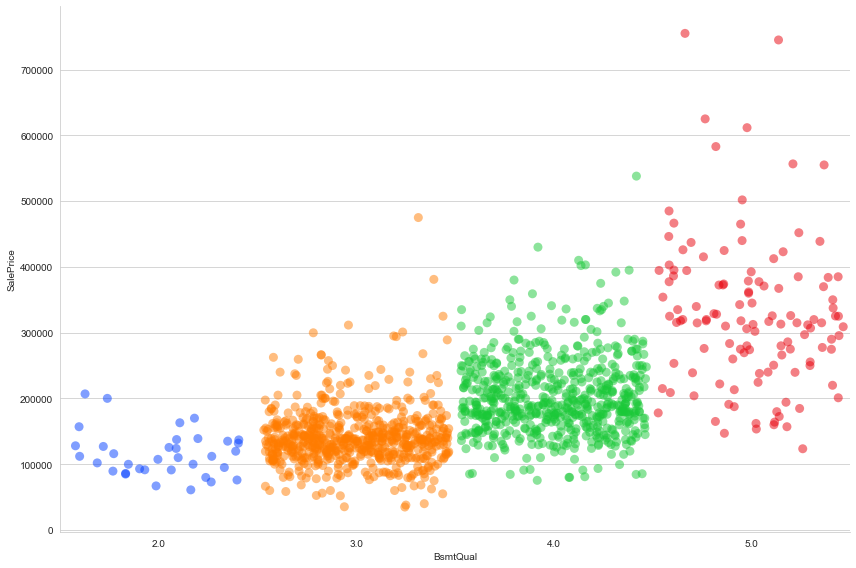

In [53]:
sns.catplot(data=train, x='BsmtQual', y='SalePrice', jitter=.47,
                 s=9, alpha=0.5, height=8, aspect=1.5, palette='bright')

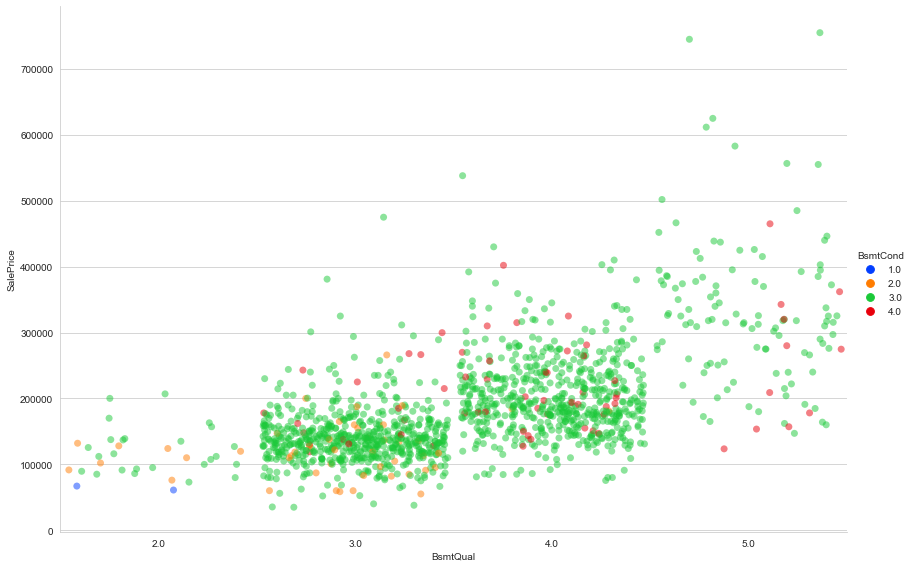

In [54]:
g = sns.catplot(data=train, x='BsmtQual', y='SalePrice', 
            hue='BsmtCond', jitter=0.47, s=7, alpha=0.5, 
            height=8, aspect=1.5, palette='bright')

BsmtQual is somewhat an odd feature as it doesn't really measure the quality of a basement but the height, according to the code book.  It seems that a basement height corresponding with (3) and (4) are the standard basement height.  As homes get more expensive their basement height does seem to increase.  However, it is interesting to see that despite the higher basements the overall BsmtCond does not seem to increase. In other words, a taller basement does not necessarily equal a nicer basement. 

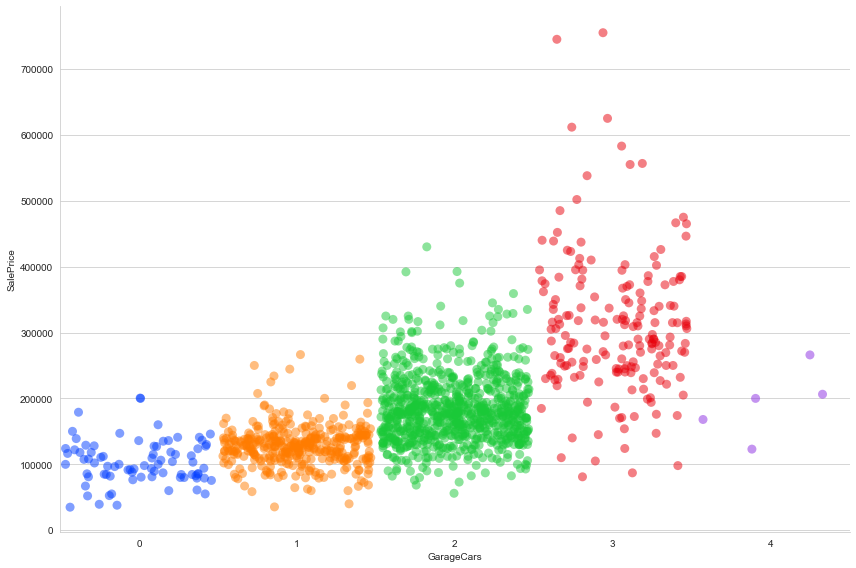

In [55]:
sns.catplot(data=train, x='GarageCars', y='SalePrice', jitter=.47,
                 s=9, alpha=0.5, height=8, aspect=1.5, palette='bright')

First and foremost we have blatent outliers in GarageCars #4. These could be simple recording errors, perhaps condos which have large parking lots or we do have some commersial properties (MSZoning = C (All)) which might have 4 or more car spots.  We dont want to fully remove these outliers as that would eliminate an entire rating group.  

We see a definitive jump in price between homes with 1 space garage compared to 2 spaces.  This might be due to the fact most families have multiple cars and a 2 car garage has simply become the norm.  Let's not forget the sheer price which is involved in adding a larger garage.  

Text(0.5, 1, 'OverallQual of a Home by SalePrice')

<Figure size 1080x720 with 0 Axes>

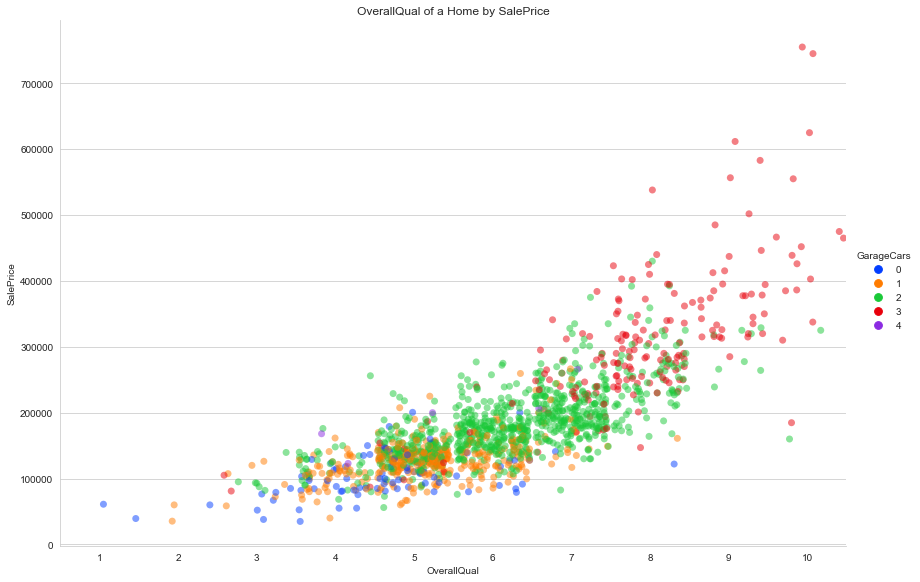

In [76]:
plt.figure(figsize=(15,10))
sns.catplot(data=train, x='OverallQual', y='SalePrice', 
            hue='GarageCars', jitter=0.47, s=7, alpha=0.5, 
            height=8, aspect=1.5, palette='bright')
plt.title('OverallQual of a Home by SalePrice', fontsize=20, pad=15)

Secondly, it seems the garage size in cars seems to have a direct impact on the OverallQual of the house. 

Text(0.5, 1, 'SalePrice by Construction Year and Number of GarageCars')

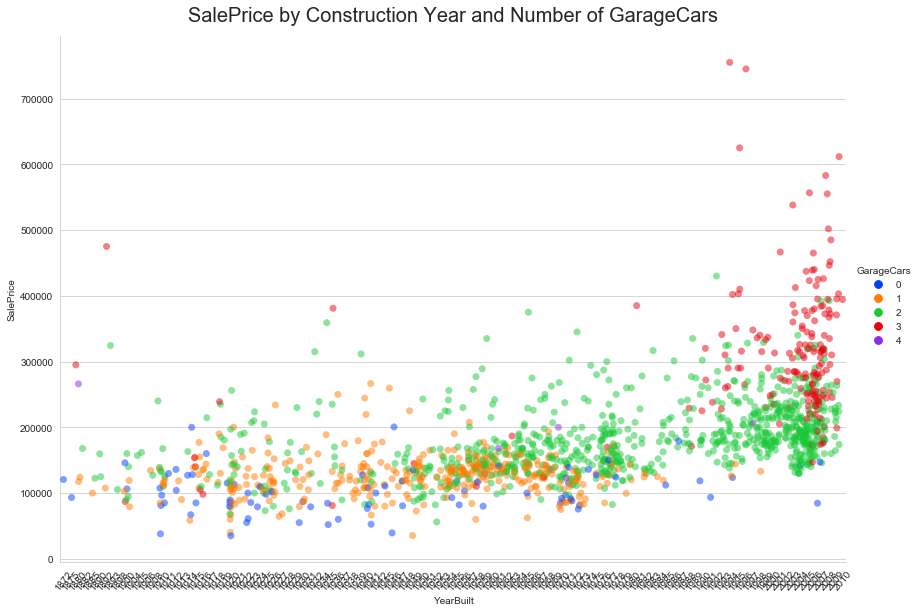

In [83]:
g = sns.catplot(data=train, x='YearBuilt', y='SalePrice', 
            hue='GarageCars', jitter=0.47, s=7, alpha=0.5, 
            height=8, aspect=1.5, palette='bright')
g.set_xticklabels(rotation=50)
plt.title('SalePrice by Construction Year and Number of GarageCars', fontsize=20, pad=15)

Finally, the garage size in terms of cars has been increasing over the years.  Where it was fairly uncommon to see a house with a garage for 2 cars in the 1950, it is becomingly more common to see homes with 3 space garages.  Granted this trend is still mostly reserved for generally more expensive homes we can potentially see this trend to continue.

Text(0.5, 1.0, 'Garage Area (SF) by Sale Price')

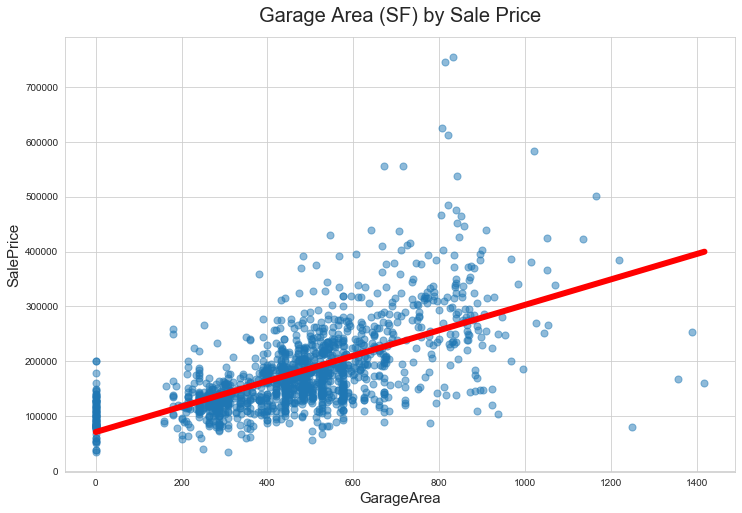

In [74]:
plt.figure(figsize=(12,8))
sns.regplot(data=train, x='GarageArea', y='SalePrice', scatter_kws={"s": 50, 'alpha':0.5}, 
             ci=None, line_kws = {'color': 'red', 'lw':6})
plt.xlabel('GarageArea', fontsize=15)
plt.ylabel('SalePrice', fontsize=15)
plt.title('Garage Area (SF) by Sale Price', fontsize=20, pad=15)

GarageArea and GarageCars seem to follow a similar trend.  An increase in garageArea has a tendency to correspond with a tentative increase in SalePrice but once the garageArea reaches around 500SF this relationship becomes more sparse. It would seem a small garage has more impact on the price of the house more than a large garage.  There is definitely a line diminishing returns when it comes to garage size.  

Last but not least, we see some potential outliers for homes with a garage area of over 1200.  Once again these might be condos or the commersial properties we discussed earlier. 

Text(0.5, 1.0, 'Total Basement SF by Sale Price')

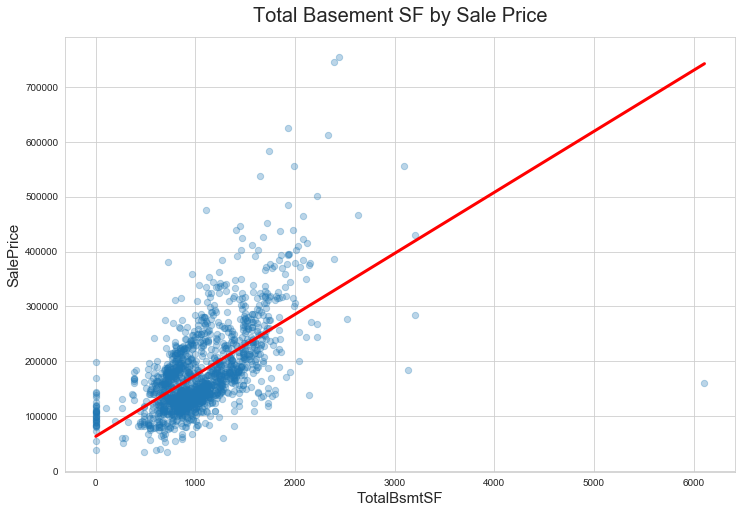

In [82]:
plt.figure(figsize=(12,8))
sns.regplot(data=train, x='TotalBsmtSF', y='SalePrice', scatter_kws={"s": 40, 'alpha':0.3}, 
             ci=None, line_kws = {'color': 'red', 'lw':3})
plt.xlabel('TotalBsmtSF', fontsize=15)
plt.ylabel('SalePrice', fontsize=15)
plt.title('Total Basement SF by Sale Price', fontsize=20, pad=15)

At first glance this relationship does not correspond to the 0.61 correlation, however, we can also see some potential outliers above 3000.  Furthermore, it seems that we have two distinct distributions.  We can see a small cluster of values between 700 and 1000 square feet and another larger cluster directly below.  There must be a moderating variable producting this odd relationship.

Text(0.5, 1.0, 'Sale Price(below $300,000) by Total Basement SF and Basement Height')

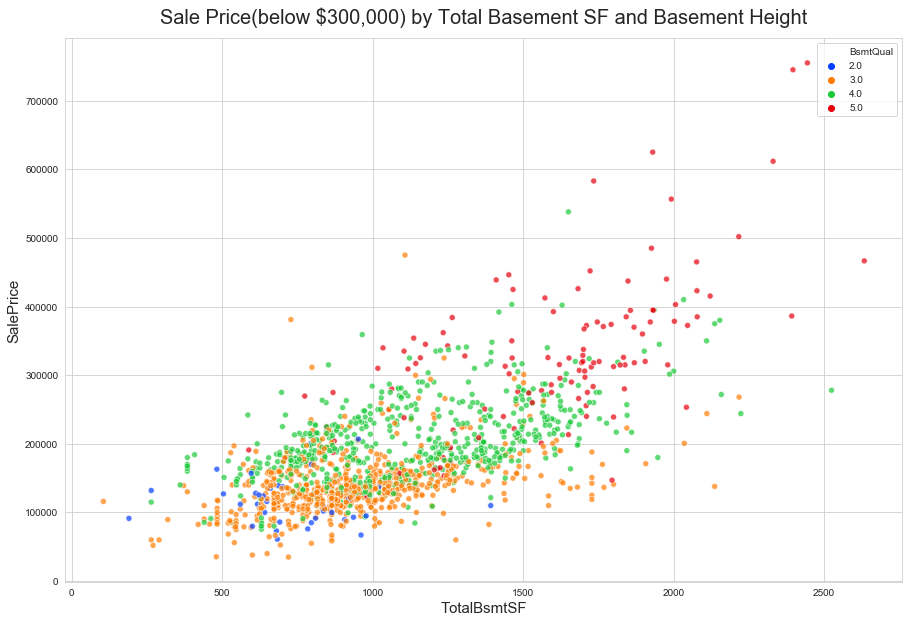

In [84]:
bsmt_total_3000 = train[train['TotalBsmtSF'] < 3000]

plt.figure(figsize=(15,10))
sns.scatterplot(bsmt_total_3000['TotalBsmtSF'], bsmt_total_3000['SalePrice'], color='darkred', 
                alpha=0.7, hue=bsmt_total_3000['BsmtQual'], palette='bright')
plt.xlabel('TotalBsmtSF', fontsize=15)
plt.ylabel('SalePrice', fontsize=15)
plt.title('Sale Price(below $300,000) by Total Basement SF and Basement Height', fontsize=20, pad=15)

If we zoom-in and remove potential outliers (ie. TotalBsmtSf above 3000) we can see a flatter (ie. smaller correlation) relationship between SalePrice and TotalBsmtSf.  Larger TotalBsmtSf tends to correlate with a higher SalePrice but much like with GarageArea there is a line of diminishing returns. Basements over 1500sf have a spurious relationship with SalePrice as potential buyers don't really see the advantages of such large basements.   

Finally, we can see that BsmtQual is our moderating variable which caused the two distinct clusters we saw above.  Larger basements in terms of square footage and height fetch a higher price compared to basements with similar square footage but lower height.  

Text(0.5, 1.0, 'Sale Price by 1st Floor SF')

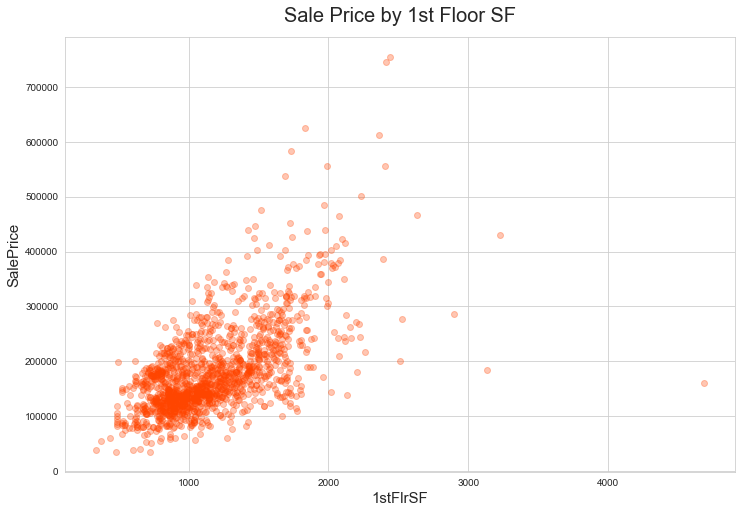

In [85]:
plt.figure(figsize=(12,8))
plt.scatter(train['1stFlrSF'], train['SalePrice'], color='orangered', alpha=0.3)
plt.xlabel('1stFlrSF', fontsize=15)
plt.ylabel('SalePrice', fontsize=15)
plt.title('Sale Price by 1st Floor SF', fontsize=20, pad=15)

The first floor in a house is typically where family members and guest congregate, therefore, it would make sense that larger 1stflrSF would fetch a higher price.  This trend is validated by the data. 

Text(0.5, 1.0, 'Sale Price by 1st Floor SF and House Style')

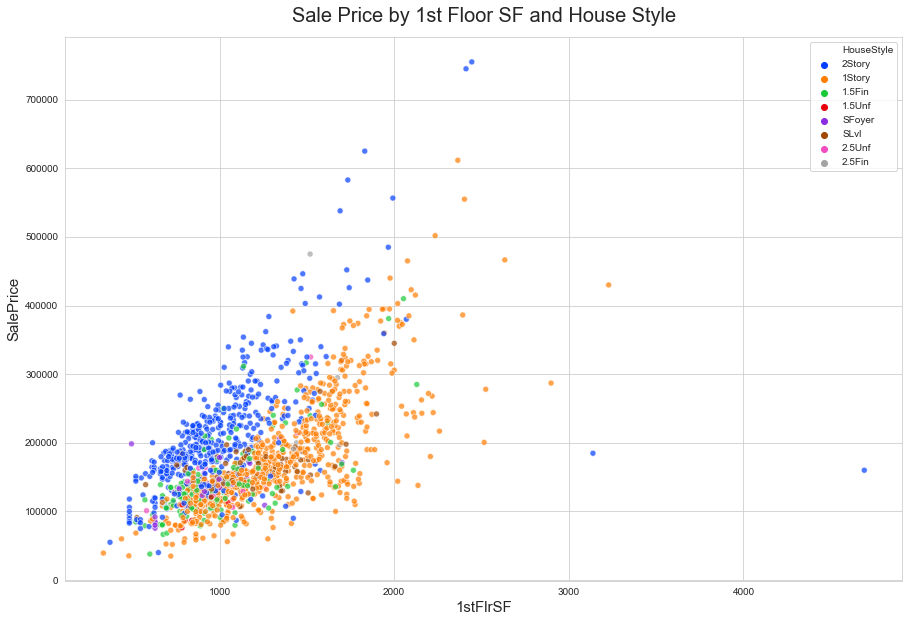

In [86]:
plt.figure(figsize=(15,10))
sns.scatterplot(train['1stFlrSF'], train['SalePrice'], color='darkred', 
                alpha=0.7, hue=train['HouseStyle'], palette='bright')
plt.xlabel('1stFlrSF', fontsize=15)
plt.ylabel('SalePrice', fontsize=15)
plt.title('Sale Price by 1st Floor SF and House Style', fontsize=20, pad=15)

However, it is interesting to see that 1Story homes despite having equal 1stfloorSF to 2Story homes fetch a generally lower price. It seems that people are willing to pay more for a 2Story home even if the 1st floor is the same to that of a 1Story home.

Text(0.5, 1, 'Sale Price by Number of Full Baths')

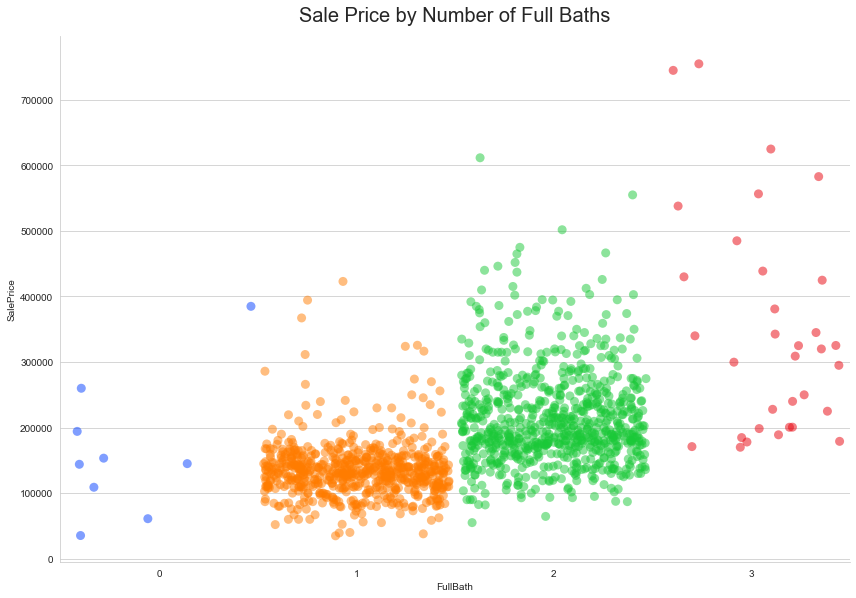

In [87]:
sns.catplot(data=train, x='FullBath', y='SalePrice', jitter=.47,
                 s=9, alpha=0.5, height=8, aspect=1.5, palette='bright')
plt.title('Sale Price by Number of Full Baths', fontsize=20, pad=15)

We see a logical linear relationship between SalePrice and the number of FullBaths.  

Text(0.5, 1, 'Sale Price by Total Number of Rooms Above Ground')

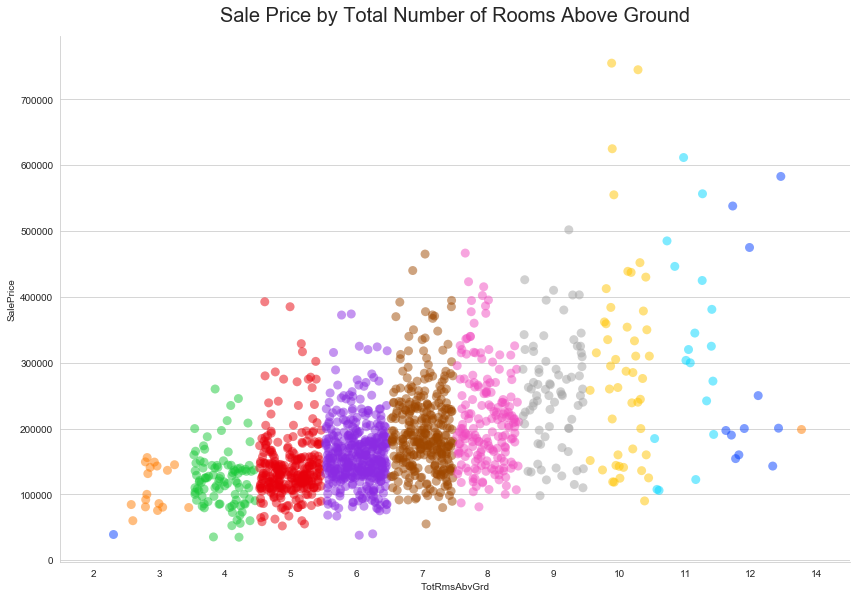

In [88]:
sns.catplot(data=train, x='TotRmsAbvGrd', y='SalePrice', jitter=.47,
                 s=9, alpha=0.5, height=8, aspect=1.5, palette='bright')
plt.title('Sale Price by Total Number of Rooms Above Ground', fontsize=20, pad=15)

The total number of rooms within a house is a major item buyers will look for.  The distribution seems to follow this logic very well but unfortunately as we approach the tail ends of the distribution the relationship does become spare.  This will unfortunately cause our models to make most of their mistakes at the tail-ends of the SalePrice distribution.   

Text(0.5, 1.0, 'Sale Price by Year of Home Construction')

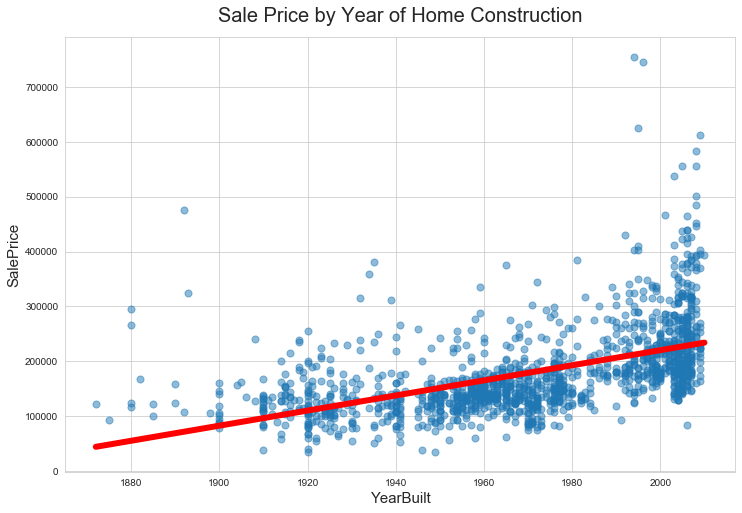

In [90]:
plt.figure(figsize=(12,8))
sns.regplot(data=train, x='YearBuilt', y='SalePrice', scatter_kws={"s": 50, 'alpha':0.5}, 
             ci=None, line_kws = {'color': 'red', 'lw':6})
plt.xlabel('YearBuilt', fontsize=15)
plt.ylabel('SalePrice', fontsize=15)
plt.title('Sale Price by Year of Home Construction', fontsize=20, pad=15)

Text(0.5, 1.0, 'Sale Price by Year of Home Construction & Home Style')

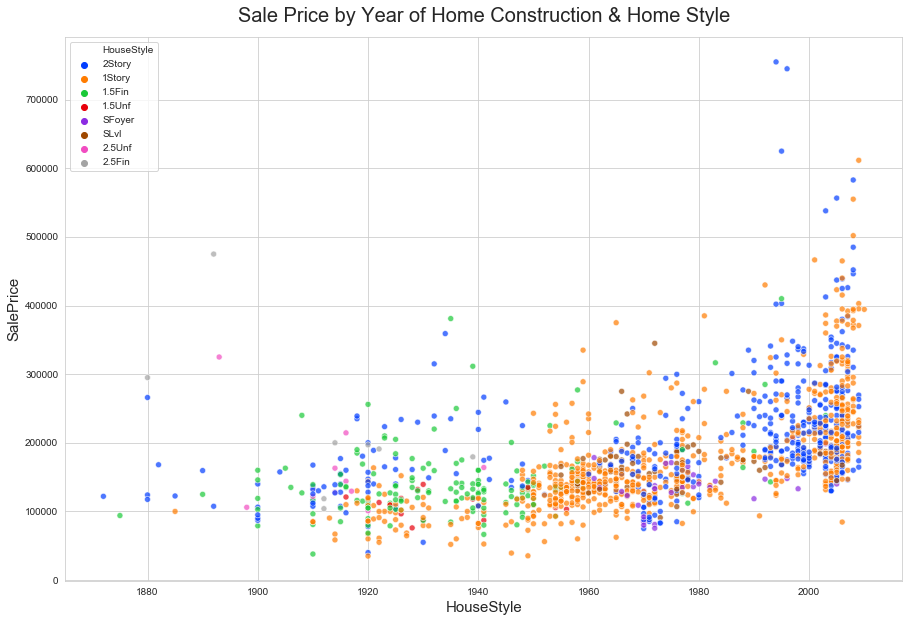

In [91]:
plt.figure(figsize=(15,10))
sns.scatterplot(train['YearBuilt'], train['SalePrice'], color='darkred', 
                alpha=0.7, hue=train['HouseStyle'], palette='bright')
plt.xlabel('HouseStyle', fontsize=15)
plt.ylabel('SalePrice', fontsize=15)
plt.title('Sale Price by Year of Home Construction & Home Style', fontsize=20, pad=15)

I believe YearBuilt is a much better predictor of SalePrice than its initial correlation.  We can definitely see a lot of outliers which are confounding this relationship. 

Needless to say the saleprice of homes as slowly increased over the years.  The number of homes being built has also increased drastically.  It is interesting to see a gap between 1940 and 1945ish and that's most likely due to WWII (ie. sept1st 1939 - sept 2ish 1945).  We then see an explosion of homes being build post war by the baby boomers.  The 1980's recession once again brough a steep decline in home building but by the 1990 we were off building once again.  

I do wonder why we see such an increase in single story construction after the war?  Prior to the war we saw 1.5 and 2 story homes greatly outnumbered 1story construction.  We would think this trend would continue as GIs, flushed with cash, would build large extra story homes.  Base on this data we would expect the majority of today's neighborhoods/subdivisions/suburbs got their start in the 1950 and 1960.  At that point in time land SF was relatively cheap and perhaps families didn't need to go up but simply expand.  Lastly, this was the era of the might "mid-century" home design which was famous for its 1story open layouts.  

Text(0.5, 1, 'Sale Price by Garage Finish')

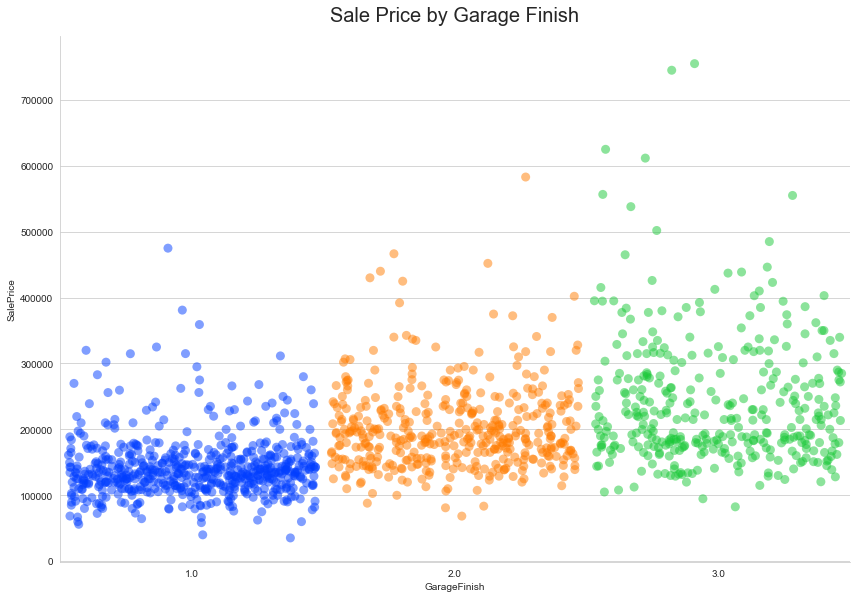

In [93]:
sns.catplot(data=train, x='GarageFinish', y='SalePrice', jitter=.47,
                 s=9, alpha=0.5, height=8, aspect=1.5, palette='bright')
plt.title('Sale Price by Garage Finish', fontsize=20, pad=15)

The overall finish of the garage (ie. 3: finished, 2: rough finished, 1: unfinished) does seem to have an impact on the house sale price but really only between unfinished and roughly finished garages.  Roughly finished and completely finished garages tend to have similar sale prices.  It would seem that if you're remodeling a house you probably should invest your money into something other (ie. the Kitchen) than a nicely finished garage.  Theres that line of diminishing returns once again.  

Text(0.5, 1.0, 'Sale Price by Year of Remodel/Addition')

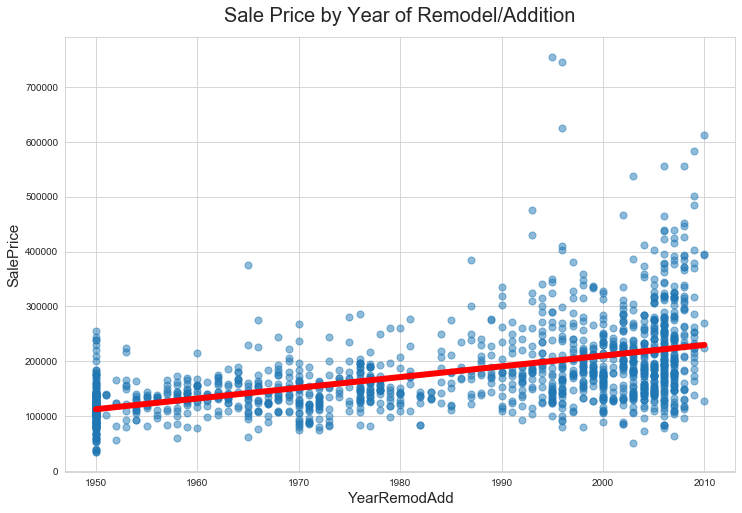

In [95]:
plt.figure(figsize=(12,8))
sns.regplot(data=train, x='YearRemodAdd', y='SalePrice', scatter_kws={"s": 50, 'alpha':0.5}, 
             ci=None, line_kws = {'color': 'red', 'lw':6})
plt.xlabel('YearRemodAdd', fontsize=15)
plt.ylabel('SalePrice', fontsize=15)
plt.title('Sale Price by Year of Remodel/Addition', fontsize=20, pad=15)

The year of remodel is a very noise feature.  We know that the overall saleprice and the number of homes being built has increased over the years, therefore, we would expect the number of remodels to increase as the homes begin to age and require updates.  


## <font color='orange'>Categorical Features</font> 

Text(0.5, 1.0, 'Sale Price over the Years')

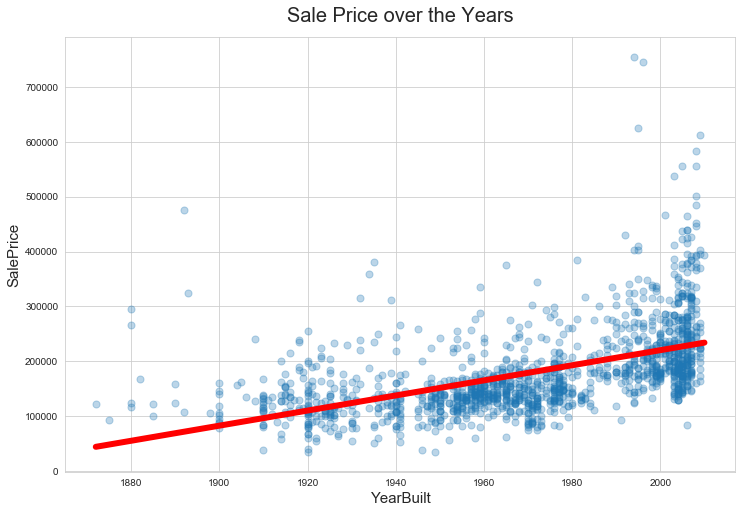

In [98]:
plt.figure(figsize=(12,8))
sns.regplot(data=train, x='YearBuilt', y='SalePrice', scatter_kws={"s": 50, 'alpha':0.3}, 
             ci=None, line_kws = {'color': 'red', 'lw':6})
plt.xlabel('YearBuilt', fontsize=15)
plt.ylabel('SalePrice', fontsize=15)
plt.title('Sale Price over the Years', fontsize=20, pad=15)

Text(0.5, 1.0, 'Number of Homes Sold by Month')

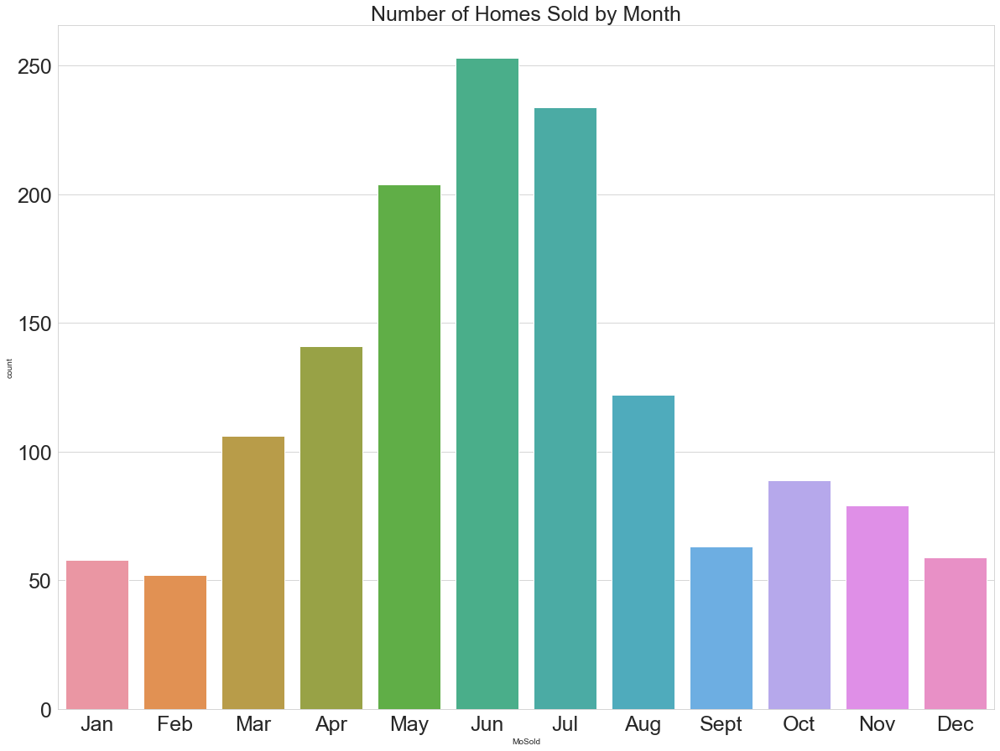

In [99]:
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 
          'Sept', 'Oct', 'Nov', 'Dec']
plt.figure(figsize=(20,15))
sns.countplot(data=train, x='MoSold', order=months)
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.title('Number of Homes Sold by Month', fontsize=25)

It is a well known fact that the real estate market, particularly in the northern states, has a tendency to die down in the fall and winter.  By the time April rolls around the market is starting to rebound and by May it is in full swing.  There are numerous reasons for this cycle but I suspect no one likes moving during the cold of winter.  Also, parents typically want their kids to start their school year at the beginning of the year (ie. Sept).  

Text(0.5, 1.0, 'Median SalePrice by Month of Sale')

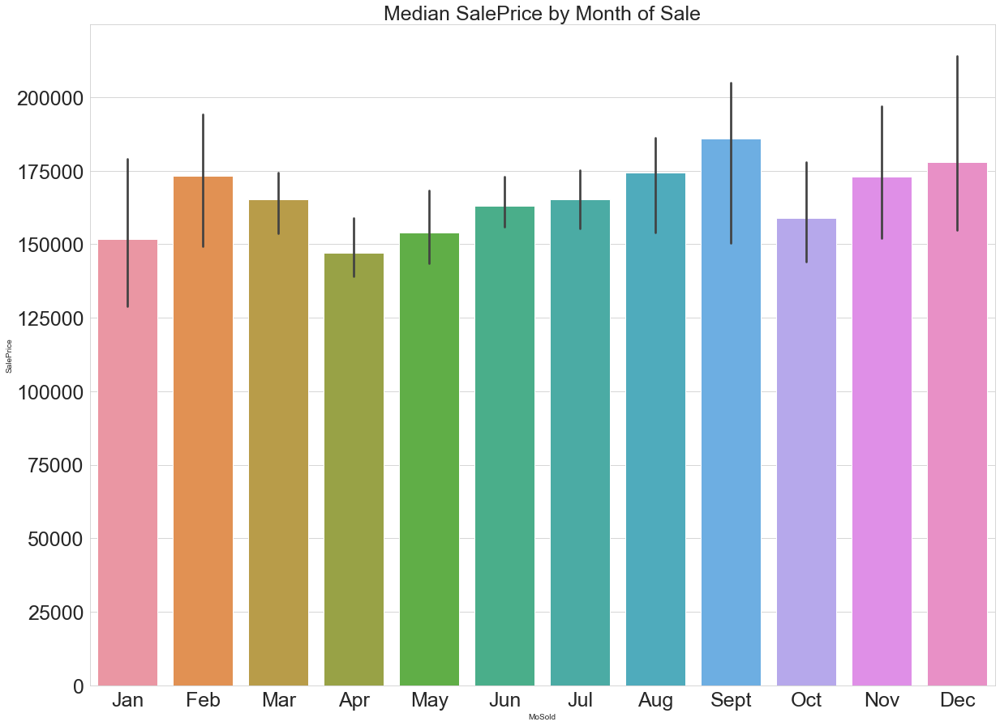

In [100]:
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 
          'Sept', 'Oct', 'Nov', 'Dec']
plt.figure(figsize=(20,15))
sns.barplot(data=train, x='MoSold', y='SalePrice', order=months, estimator=np.median)
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.title('Median SalePrice by Month of Sale', fontsize=25)

However, it is interesting that the median sale price is not the highest during the summer months.  It is actually September which has the highest median home prices.  Could it be that the number of homes for sale has drastically been reduced, therefore, available buyers must pay a slight premium? (supply and demand).

We all know the old cliche "Location, Location, Location".  The location of your house is most likely the main predictor of general SalePrice.  In its current form it is a categorical feature but let's see if we can uncover something interesting.

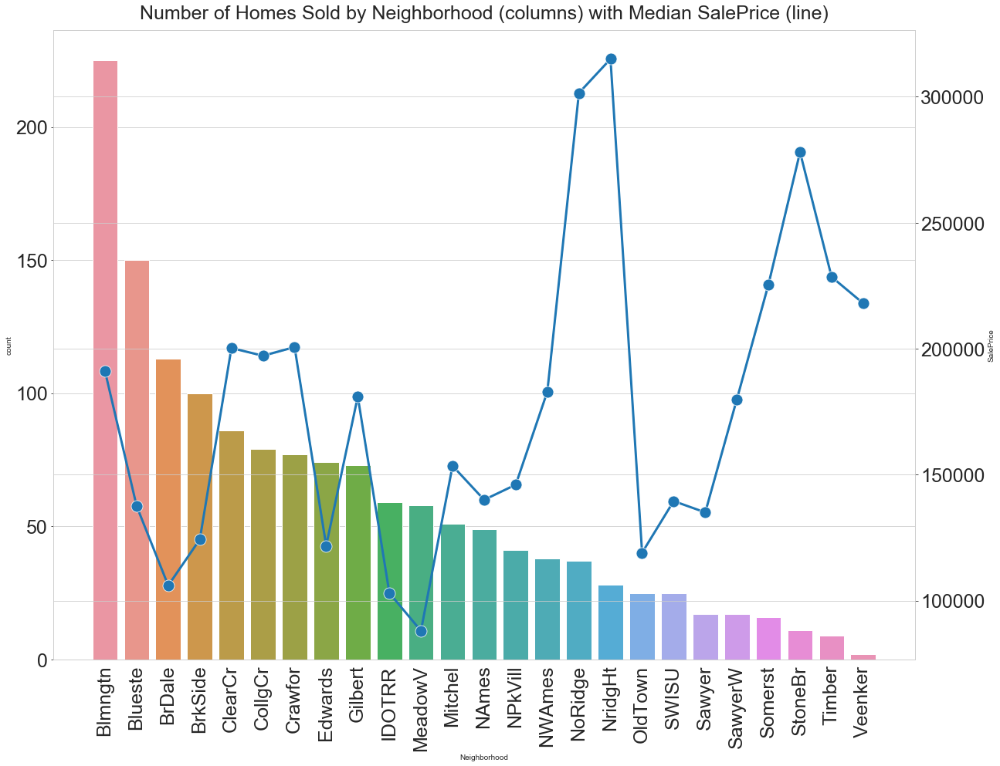

In [109]:
fig = plt.figure(figsize=(20,15))
ax1 = fig.add_subplot(111)
sns.countplot(data=train, x='Neighborhood', order=train['Neighborhood'].value_counts().index, ax=ax1)
plt.xticks(rotation=90, fontsize=25)
plt.yticks(fontsize=25)

ax2 = ax1.twinx()
sns.lineplot(data=train, x='Neighborhood', y='SalePrice', ax=ax2, estimator=np.median, 
             marker='o', linewidth=3, ci=False, markersize=15)
plt.yticks(fontsize=25)
plt.title('Number of Homes Sold by Neighborhood (columns) with Median SalePrice (line)', fontsize=25, pad=15)
plt.show()

Text(0.5, 1.0, 'Median SalePrice by Neighborhood')

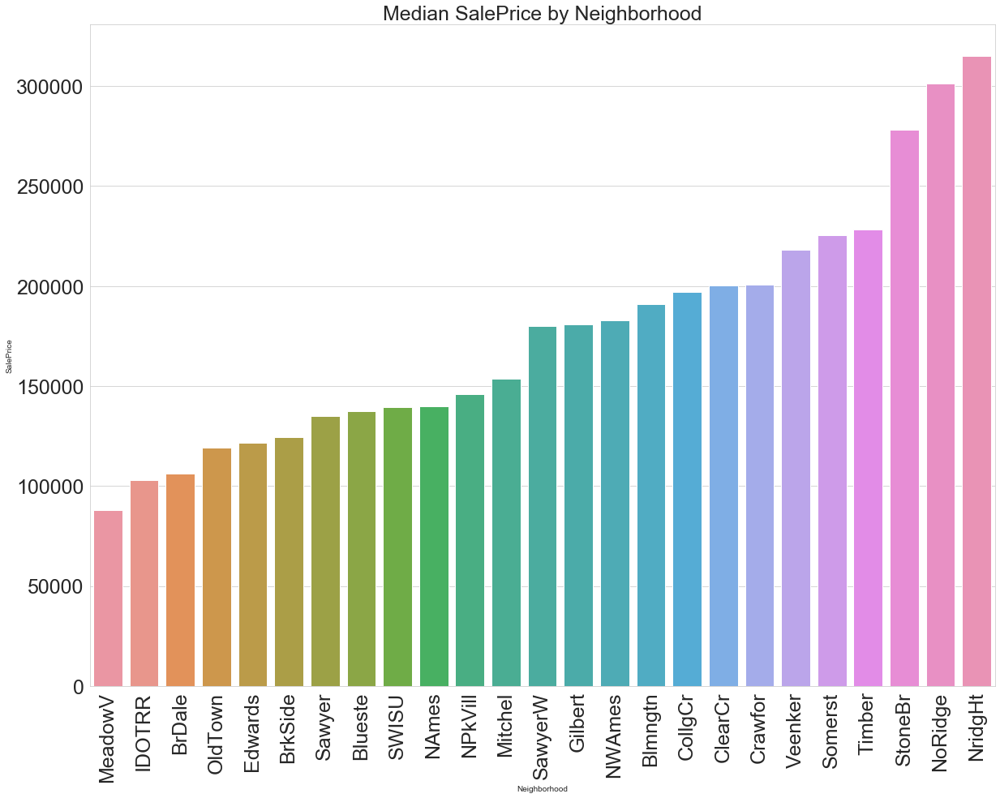

In [102]:
median_price_hood = train.groupby('Neighborhood')['SalePrice'].aggregate(np.median).reset_index().sort_values('SalePrice')
plt.figure(figsize=(20,15))
g = sns.barplot(data=median_price_hood, x='Neighborhood', y='SalePrice', order=median_price_hood['Neighborhood'])
plt.xticks(rotation=90)
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.title('Median SalePrice by Neighborhood', fontsize=25)


The median price of a house per neighborhood is a great feature from an exploratory perspective but we cannot use this for our model as it'll leak training data into test data.  That said, we can see that StoneBr, NoRidge and NridgHt have some of the highest median home prices.  

Text(0.5, 1.0, 'Average Number of Rooms by Neighborhood')

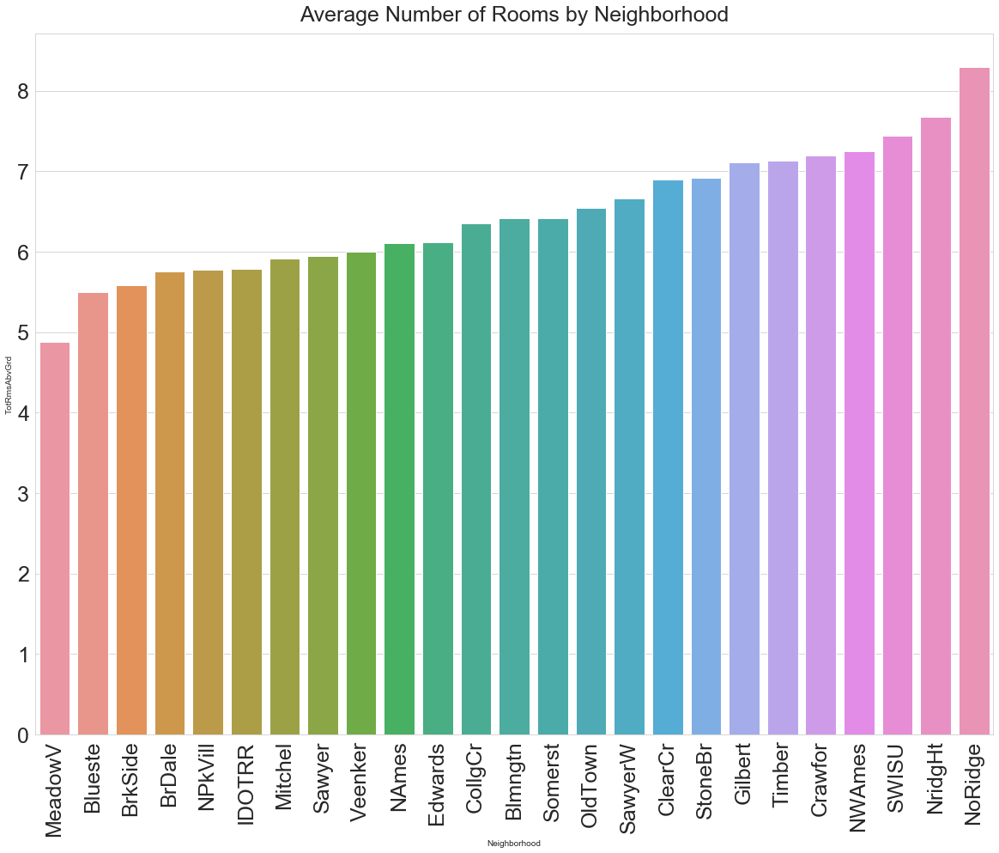

In [112]:
mean_rms = train.groupby('Neighborhood')['TotRmsAbvGrd'].aggregate(np.mean).reset_index().sort_values('TotRmsAbvGrd')
plt.figure(figsize=(20,15))
g = sns.barplot(data=mean_rms, x='Neighborhood', y='TotRmsAbvGrd', order=mean_rms['Neighborhood'])
plt.xticks(rotation=90)

plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.title('Average Number of Rooms by Neighborhood', fontsize=25, pad=15)

Using SalePrice by Neighborhood would lead to data leakage but since the Test dataset already has TotRmsAbvGrd we can use this feature instead.  From our previous analysis we know that the average home price increases as the number of bedrooms increases.  

In [113]:
test.loc[1132, 'GarageYrBlt'] = 2007

It seems there is a recording error as the last year a garage was built was 2207.  Let's recode this error to 2007. 

In [114]:
test.loc[416, 'YearRemodAdd'] = 2002

We have another error in the test data as the yearbuilt comes after the year the house was remodeled.  Let's convert YearRemodAdd to 2002

In [115]:
#train.drop(train[(train['OverallQual'] == 10) & (train['SalePrice'] < 200000)].index, inplace=True)
train.drop(train[train['GrLivArea'] > 4000].index, inplace=True)
#train.drop(train[(train['ExterQual'] == 4) & train['SalePrice'] > 600000].index, inplace=True)
#train.drop(train[(train['OverallQual'] == 4) & (train['SalePrice'] > 200000)].index, inplace=True)
#train.drop(train[(train['KitchenQual'] == 3) & (train['SalePrice'] > 300000)].index, inplace=True)
#train.drop(train[(train['KitchenQual'] == 4) & (train['SalePrice'] > 600000)].index, inplace=True)
#train.drop(train[(train['KitchenQual'] == 5) & (train['SalePrice'] < 150000)].index, inplace=True)
#train.drop(train[(train['BsmtQual'] == 3) & (train['SalePrice'] > 400000)].index, inplace=True)
#train.drop(train[(train['BsmtQual'] == 4) & (train['SalePrice'] > 500000)].index, inplace=True)
#train.drop(train[(train['GarageArea'] > 1200) & (train['SalePrice'] < 300000)].index, inplace=True)
#train.drop(train[(train['TotalBsmtSF'] > 3000) & (train['SalePrice'] < 300000)].index, inplace=True)
#train.drop(train[(train['FullBath'] == 0) & (train['SalePrice'] > 350000)].index, inplace=True)
#train.drop(train[(train['YearBuilt'] < 1900) & (train['SalePrice'] > 200000)].index, inplace=True)


We during the above EDA we discovered many data points which could be potential outliers.  However, after running the analysis in various iterations the only outliers which improves model performance is GrLivArea > 4000.  

In [116]:
train.reset_index(drop=True, inplace=True)
test.reset_index(drop=True, inplace=True)

In [117]:
train.shape, test.shape

((1456, 81), (1459, 80))

## Checking for Multicolinearity

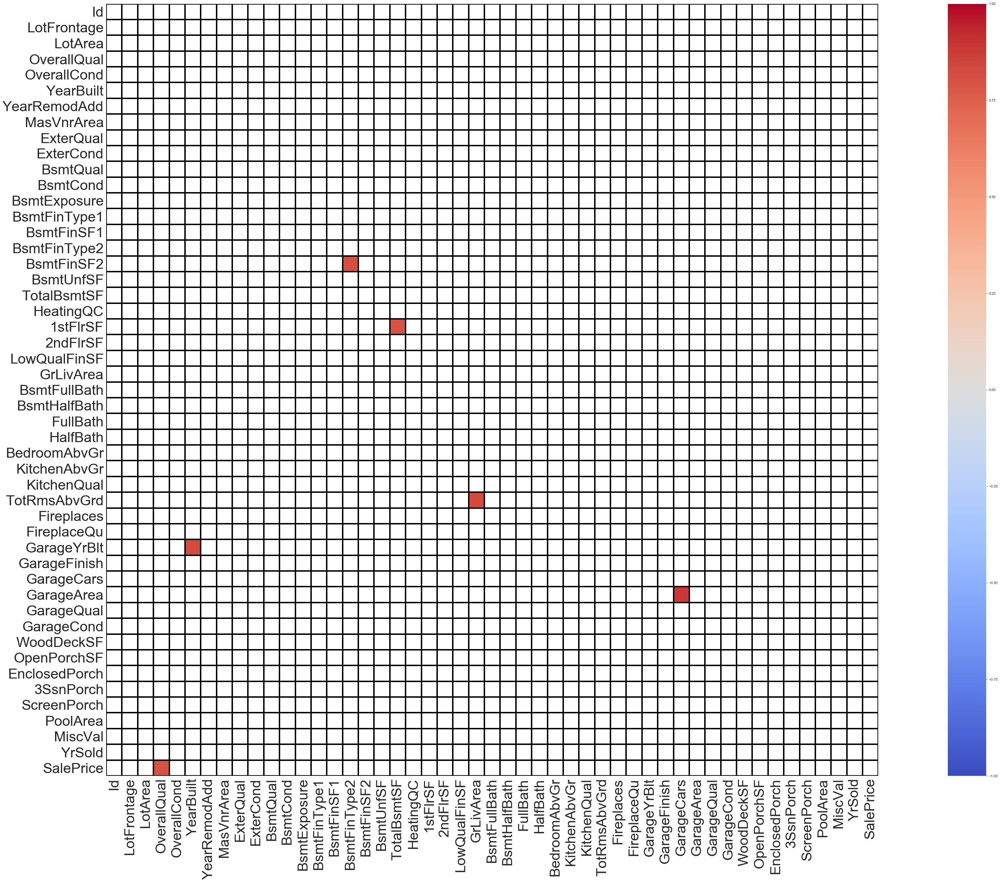

In [118]:
correlation = train[num_feats].corr()
eighty = correlation[(correlation >= 0.75) | (correlation <= -0.75)]
mask = np.zeros_like(eighty, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
plt.figure(figsize=(70,40))
plt.xticks(fontsize=40)
plt.yticks(fontsize=40)
sns.set_style('whitegrid')
sns.heatmap(eighty,
           cmap='coolwarm',
            fmt=".2f",
            cbar=True,
            linewidths=3,
            linecolor='black',
            vmin=-1, 
            mask=mask,
           center=0,
           square=True)

In [119]:
train.drop(['GarageCars', 'GarageYrBlt', 'BsmtFinType2'], axis=1, inplace=True)
test.drop(['GarageCars', 'GarageYrBlt', 'BsmtFinType2',], axis=1, inplace=True)

We are going to drop a few features which are highly correlated.

## <font color='orange'>Concatenating Train/Test </font> 

In [120]:
df = pd.concat([train, test])

In [121]:
df.reset_index(drop=True, inplace=True)

## <font color='orange'>Check for Duplicate Columns</font> 

In [122]:
def getDupCols(df):
    dup_cols = []
    
    # iterate over range from 0 to the total num of columns
    for x in range(df.shape[1]):
        
        # select the column
        col = df.iloc[:, x]
        
        # Iterate over the subsequent column through the total num of columns
        for y in range(x + 1, df.shape[1]):
            
            # select the second column
            col2 = df.iloc[:, y]
            
            # if col==col2 append
            if col.equals(col2):
                dup_cols.append(df.columns.values[y])
    
    return dup_cols

In [123]:
getDupCols(df)

[]

## <font color='orange'>Check for Duplicate Rows Based on All Features</font> 

In [124]:
df[df.duplicated()]

,Id,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,MSSubClass_fix


## <font color='orange'>Cardinality</font> 

In [ ]:
for col in df.columns:
    print(col, df[col].nunique(dropna=False), len(df))

'Id' is the only column which we would remove but since we need it to split train and test we'll keep it for the time being. 

In [ ]:
for col in df.columns:
    print(col, '\n', df[col].value_counts(dropna=False)/len(df))

By looking at the cardinality of each categorical feature we can see the percentage of times each value appears in each feature.  Features which have values which take most of the variance (90%+) can be deleted as they only add noise and are very likely to cause our model(s) to overfit.  By reducing the number of features leads to less complex (ie. more genealizable) models.  They features we'll be removed from both train and test.
- Street
- Alley
- Utilities
- LandSlope
- Condition2
- RoofMatl
- Heating
- Electrical
- Bsmthalfbath
- Functional
- PavedDrive
- LowQualFinSF
- 3SsnPorch
- ScreenPorch
- PoolArea
- PoolQC, 
- MiscFeature,
- MiscVal

In [125]:
# Dropping features with categories which make up 90%+ of variance
df.drop(['Street', 'Alley', 'Utilities','LandSlope','Condition2','RoofMatl',
         'Heating','Electrical', 'LowQualFinSF', 'BsmtHalfBath', 'KitchenAbvGr',
         'Functional', 'PavedDrive','3SsnPorch', 'ScreenPorch', 
         'PoolArea', 'PoolQC', 'MiscFeature', 'MiscVal'], axis=1, inplace=True)

## <font color='orange'>Missing Values</font> 

In [126]:
# missing values for train
for col in df.columns:
    if df[col].isnull().sum()/len(df) > 0:
        print(col, df[col].isnull().mean().round(4))
        

MSZoning 0.0014
LotFrontage 0.1667
Exterior1st 0.0003
Exterior2nd 0.0003
MasVnrType 0.0082
MasVnrArea 0.0079
BsmtQual 0.0278
BsmtCond 0.0281
BsmtExposure 0.0281
BsmtFinType1 0.0271
BsmtFinSF1 0.0003
BsmtFinSF2 0.0003
BsmtUnfSF 0.0003
TotalBsmtSF 0.0003
BsmtFullBath 0.0007
KitchenQual 0.0003
FireplaceQu 0.4871
GarageType 0.0539
GarageFinish 0.0545
GarageArea 0.0003
GarageQual 0.0545
GarageCond 0.0545
Fence 0.8045
SaleType 0.0003
SalePrice 0.5005


#### A missing data point for these features simply means the house doesn't posses the attribute and we'll impute missing values with 'None
- Fence, GarageType MasVnrType, GarageYrBlt

#### These features we'll use the mode to impute missing values.  We know from the codebook that missing values mean "typical" and typically is the most frequent value (ie.mode)
- KitchenQual, Exterior1st, Exterior2nd, SaleType, MSZoning

#### These features we'll impute missing values with 0 (zero) as they are numerical and None wouldn't work.  A zero also means the house does not posses these attributes
-  GarageCars,MasVnrArea,BsmtFinSF1,'BsmtUnfSF','BsmtFinSF2','BsmtHalfBath','BsmtFullBath','TotalBsmtSF', FireplaceQu BsmtQual BsmtCond BsmtExposure BsmtFinType1 BsmtFinType2, GarageFinish GarageQual GarageCond, GarageArea

#### LotFrontage is a continuous feature, we'll use a RandomForest to predict its values.  It is important to impute this feature last as the RF cannot handle missing datapoints from the input features

In [127]:
for var in ['Fence','GarageType','MasVnrType']:
    df[var].fillna('None', inplace=True)

# We know from the codebook that missing values mean "typical" and typically is the most frequent value (ie.mode)
for var in ['KitchenQual', 'Exterior1st', 'Exterior2nd', 'SaleType', 'MSZoning']:
    df[var].fillna(df[var].mode()[0], inplace=True)

# We know from the codebook that a missing value for these features simply means the house does not possess
#  these attributes (ex: BsmtFullBath=0 if the house doesnt have a basement)
for var in ['MasVnrArea','BsmtFinSF1', 'BsmtUnfSF', 'BsmtFinSF2', 
            'BsmtFullBath', 'TotalBsmtSF', 'FireplaceQu', 'BsmtQual', 
            'BsmtCond', 'BsmtExposure','BsmtFinType1', 'GarageFinish',
            'GarageQual', 'GarageCond', 'GarageArea']:
    df[var].fillna(0, inplace=True)
    

In [128]:
for col in df.columns:
    if df[col].isnull().sum()/len(df) > 0:
        print(col, df[col].isnull().mean().round(3))

LotFrontage 0.167
SalePrice 0.501


Examining the correlations with 'LotFrantage' will help us determine which features we need to input into the RandomForest as predictors. 

In [129]:
# We'll use the highly correlated features to predict LotFrontage
df.corr()['LotFrontage'].sort_values(ascending=False)

LotFrontage      1.000000
LotArea          0.468266
1stFlrSF         0.430458
SalePrice        0.356773
GrLivArea        0.349662
GarageArea       0.347850
TotRmsAbvGrd     0.337783
TotalBsmtSF      0.312489
Fireplaces       0.247829
FireplaceQu      0.244385
BedroomAbvGr     0.237550
GarageFinish     0.221751
MasVnrArea       0.204084
OverallQual      0.204049
BsmtExposure     0.177134
FullBath         0.175212
KitchenQual      0.172181
BsmtFinSF1       0.169273
ExterQual        0.151924
OpenPorchSF      0.148440
GarageQual       0.122715
YearBuilt        0.118095
WoodDeckSF       0.117436
BsmtUnfSF        0.117046
GarageCond       0.112032
BsmtQual         0.103979
BsmtFullBath     0.099389
YearRemodAdd     0.086946
HeatingQC        0.080024
BsmtFinSF2       0.050860
BsmtFinType1     0.038187
HalfBath         0.030649
EnclosedPorch    0.014711
2ndFlrSF         0.008670
YrSold          -0.006855
BsmtCond        -0.007136
ExterCond       -0.011644
Id              -0.025094
OverallCond 

In [130]:
# create a df with LotFrontage and all its highly correlated features. 
# full df with LotFrontage missing and not missing
lot_front_df = df[['LotFrontage','LotArea', '1stFlrSF', 'GrLivArea', 'TotRmsAbvGrd',
                      'GarageArea','TotalBsmtSF', 'BedroomAbvGr',
                      'Fireplaces', 'FireplaceQu', 'GarageFinish', 'OverallQual', 
                      'FullBath', 'KitchenQual', 'BsmtExposure', 'ExterQual', 
                      'MasVnrArea', 'BsmtUnfSF', 'BsmtFinSF1']]

# Separating out df based on whether or not LotFrontage is null
lot_front_notnull = lot_front_df.loc[df['LotFrontage'].notnull()]
lot_front_isnull = lot_front_df.loc[df['LotFrontage'].isnull()]

# creating our training, testing and y datasets while also creating dummy features 
X_train_lot_front = pd.get_dummies(lot_front_notnull.drop(columns=['LotFrontage']), drop_first=True)
X_test_lot_front = pd.get_dummies(lot_front_isnull.drop(columns=['LotFrontage']), drop_first=True)
y_train_lot_front = lot_front_notnull['LotFrontage']

# We train the model on data which contains LotFrontage values and our actual y values
# We predict LotFrontage values into our test set
rf = RandomForestRegressor(n_estimators=50, n_jobs=-1)
rf.fit(X_train_lot_front, y_train_lot_front)
pred = rf.predict(X_test_lot_front)

rf.score(X_train_lot_front, y_train_lot_front)

0.9318826482131305

In [131]:
# Finaly imputing missing values with predicted values
df.loc[df['LotFrontage'].isnull(), ['LotFrontage']] = pred

All missing values for current features have been imputed

## <font color='orange'>Adding New Features</font> 

In [132]:
df['total_baths'] = (df['FullBath']) + (df['HalfBath'] * 0.5) + (df['BsmtFullBath'])
df['mean_neigh_rms'] = df.groupby('Neighborhood')['TotRmsAbvGrd'].transform('mean')
df['median_neigh_rms'] = df.groupby('Neighborhood')['TotRmsAbvGrd'].transform('median')

df['total_sq_ft'] = df['TotalBsmtSF'] + df['1stFlrSF'] + df['2ndFlrSF']
    
df['total_area'] = df['TotalBsmtSF'] + df['1stFlrSF'] + df['2ndFlrSF'] + df['GarageArea'] + df['WoodDeckSF'] + df['OpenPorchSF'] + df['EnclosedPorch']    
df['used_lot_ratio'] = df['LotArea'] / df['total_area']    
df['years_since_remodel'] = int(datetime.datetime.today().strftime('%Y')) - df['YearRemodAdd']
df['years_until_remodel'] = df['YearRemodAdd'] - df['YearBuilt']
df['years_old'] = int(datetime.datetime.today().strftime('%Y')) - df['YearBuilt']
df['geometry'] = df['LotArea'] / df['LotFrontage']
df['summer_sale'] = np.where((df['MoSold'] == 'May') | (df['MoSold'] == 'Jun') |
                             (df['MoSold'] == 'Jul'), 'summer_sale', 'non_summer_sale')


## <font color='orange'>Skew Transformations</font> 
Examining the skew of all continuous features.  The closer the skew is to zero the more normal of a distribution the feature holds.

In [133]:
# Checking the skew of training features

num_feats = df.dtypes[df.dtypes != 'object'].index

skewed_feats = df[num_feats].apply(lambda x: skew(x)).sort_values(ascending=False)
skewed_feats

LotArea                13.123758
geometry                9.706123
used_lot_ratio          8.066152
BsmtFinSF2              4.142863
EnclosedPorch           4.000796
MasVnrArea              2.600697
OpenPorchSF             2.529245
years_until_remodel     2.061518
WoodDeckSF              1.848285
ExterCond               1.314225
1stFlrSF                1.253011
BsmtExposure            1.242868
median_neigh_rms        1.046599
GrLivArea               0.977860
BsmtFinSF1              0.974138
LotFrontage             0.954281
total_sq_ft             0.936173
BsmtUnfSF               0.920135
total_area              0.873130
2ndFlrSF                0.843237
ExterQual               0.782946
mean_neigh_rms          0.769966
TotRmsAbvGrd            0.749579
Fireplaces              0.725958
HalfBath                0.698770
TotalBsmtSF             0.662657
BsmtFullBath            0.622820
years_old               0.598087
OverallCond             0.569143
total_baths             0.477616
years_sinc

In [134]:
df['geometry'] = boxcox1p(df['geometry'],boxcox_normmax(df['geometry'] + 1))
df['LotArea'] = np.log1p(df['LotArea'])
df['used_lot_ratio'] = np.log(df['used_lot_ratio'])
df['BsmtFinSF2'] = np.log1p(df['BsmtFinSF2'])
df['EnclosedPorch'] = np.log1p(df['EnclosedPorch'])
df['MasVnrArea'] = np.log1p(df['MasVnrArea'])
df['OpenPorchSF'] = np.log1p(df['OpenPorchSF'])
df['years_until_remodel'] = boxcox1p(df['years_until_remodel'],boxcox_normmax(df['years_until_remodel'] + 1))
df['WoodDeckSF'] = np.log1p(df['WoodDeckSF'])
df['ExterCond'], param = stats.boxcox(df['ExterCond'])
df['1stFlrSF'], param = stats.yeojohnson(df['1stFlrSF'])
df['BsmtExposure'], param = stats.yeojohnson(df['BsmtExposure'])
df['median_neigh_rms'], param = stats.boxcox(df['median_neigh_rms'])
df['BsmtFinSF1'] = np.sqrt(df['BsmtFinSF1'])
df['LotFrontage'] = boxcox1p(df['LotFrontage'],boxcox_normmax(df['LotFrontage'] + 1))
df['total_sq_ft'] = boxcox1p(df['total_sq_ft'],boxcox_normmax(df['total_sq_ft'] + 1))
df['GrLivArea'] = boxcox1p(df['GrLivArea'],boxcox_normmax(df['GrLivArea'] + 1))
df['BsmtUnfSF'] = boxcox1p(df['BsmtUnfSF'],boxcox_normmax(df['BsmtUnfSF'] + 1))
df['total_area'], param = stats.boxcox(df['total_area'])
df['mean_neigh_rms'], param = stats.boxcox(df['mean_neigh_rms'])
df['2ndFlrSF'] = np.log1p(df['2ndFlrSF'])
df['ExterQual'], param = stats.boxcox(df['ExterQual'])
df['TotRmsAbvGrd'], param = stats.boxcox(df['TotRmsAbvGrd'])
df['Fireplaces'] = np.sqrt(df['Fireplaces'])
df['HalfBath'] = np.sqrt(df['HalfBath'])
df['TotalBsmtSF'], param = stats.yeojohnson(df['TotalBsmtSF'])
df['OverallCond'] = np.sqrt(df['OverallCond'])
df['BsmtFullBath'], param = stats.yeojohnson(df['BsmtFullBath'])
df['years_old'], param = stats.boxcox(df['years_old'])
df['years_since_remodel'] = np.log1p(df['years_since_remodel'])
df['YearRemodAdd'] = np.power(df['YearRemodAdd'], 11)
df['HeatingQC'] = np.power(df['HeatingQC'], 7)
df['YearBuilt'], param = stats.yeojohnson(df['YearBuilt'])
df['BsmtQual'] = boxcox1p(df['BsmtQual'],boxcox_normmax(df['BsmtQual'] + 1))
df['GarageQual'] = np.power(df['GarageQual'], 2.9)
df['GarageCond'] = np.power(df['GarageCond'], 2.8)
df['BsmtCond'] = np.power(df['BsmtCond'], 2.3)

In [135]:
# Checking the skew after our transformations
num_feats = df.dtypes[df.dtypes != 'object'].index

skewed_feats = df[num_feats].apply(lambda x: skew(x)).sort_values(ascending=False)
skewed_feats

BsmtFinSF2             2.460035
EnclosedPorch          1.958822
BsmtExposure           0.802340
years_until_remodel    0.620649
HalfBath               0.558236
MasVnrArea             0.538392
total_baths            0.477616
KitchenQual            0.436375
BsmtFullBath           0.357649
BedroomAbvGr           0.328129
GarageQual             0.320013
2ndFlrSF               0.308075
GarageArea             0.217748
OverallQual            0.181902
FireplaceQu            0.174376
WoodDeckSF             0.160936
FullBath               0.159917
GarageFinish           0.137879
YrSold                 0.130909
Fireplaces             0.101505
ExterCond              0.099499
BsmtQual               0.093136
BsmtUnfSF              0.054250
years_since_remodel    0.048181
LotFrontage            0.045193
total_sq_ft            0.026343
total_area             0.026152
YearRemodAdd           0.010344
GrLivArea              0.008765
TotRmsAbvGrd           0.003415
BsmtCond              -0.000036
1stFlrSF

We were able to adjust the skewness for most of our features. 

Although some features we were not able to correct as much as we would have liked (ie. KitchenAvgGr, BsmtFinSF2, EnclosedPorch) the majority of features have a relatively low skew.  Below are the transformations used.
- df[feature] = np.log(df[feature])
- df[feature] = np.log1p(df[feature])
- df[feature] = 1/(df[feature])
- df[feature] = np.sqrt(df[feature])
- df[feature] = np.power(df[feature], 3)
- df[feature], param = stats.boxcox(df[feature])
- df[feature] = boxcox1p(df[feature],boxcox_normmax(df[feature] + 1))
- df[feature], param = stats.yeojohnson(df[feature])

In [22]:
df.drop('Id', axis=1, inplace=True)

## <font color='orange'>Creating Polynomial Features w/Interaction</font> 
Many of the numerical features we examined during EDA had a slight curvilinear relationship with the target, let's create additional polynomial features including interaction 

In [136]:
y_train = df['SalePrice'].dropna()

In [137]:
df.drop('SalePrice', axis=1, inplace=True)

In [138]:
num_feats = df.select_dtypes(exclude='object').columns.tolist()

In [139]:
num_feats.remove('Id')

In [140]:
# include 2nd degree polynomial features including an interaction. 
poly = PolynomialFeatures(degree=2, include_bias=False)
poly_feats = poly.fit_transform(df[num_feats])
df_num = pd.DataFrame(poly_feats)
print(df_num)

              0         1    2         3             4             5  \
0     19.202747  9.042040  7.0  2.236068  2.280527e+71  5.911326e+18   
1     21.954275  9.169623  6.0  2.828427  1.691714e+71 -4.260060e+17   
2     19.771352  9.328212  7.0  2.236068  2.230937e+71  6.607839e+18   
3     18.231842  9.164401  7.0  2.236068  8.484726e+70  2.475628e+18   
4     22.652996  9.565284  8.0  2.236068  2.206530e+71  7.814625e+17   
...         ...       ...  ...       ...           ...           ...   
2910   9.074856  7.568896  4.0  2.645751  1.582203e+71  2.475628e+18   
2911   9.074856  7.546974  4.0  2.236068  1.582203e+71  2.475628e+18   
2912  34.121945  9.903538  5.0  2.645751  1.414569e+71 -2.182663e+18   
2913  18.623841  9.253591  5.0  2.236068  2.020242e+71  1.645921e+18   
2914  20.880073  9.172431  7.0  2.236068  2.042679e+71  5.512840e+18   

             6         7         8          9         10        11   12  \
0     5.283204  0.861453  1.264439  12.890478  12.513503 -0.

In [141]:
df_cat = df.select_dtypes(include='object')

In [142]:
df_new = df_cat.merge(df_num, left_index=True, right_index=True)

In [143]:
df_new.head()

,MSZoning,LotShape,LandContour,LotConfig,Neighborhood,Condition1,BldgType,HouseStyle,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,Foundation,CentralAir,GarageType,Fence,MoSold,SaleType,SaleCondition,MSSubClass_fix,summer_sale,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,

## <font color='orange'>X_train, Y_train, X_test Split</font> 

In [144]:
df_new[1420:1460]

MSZoning LotShape LandContour LotConfig Neighborhood Condition1 BldgType  \
1420       RL      Reg         Lvl    Inside        NAmes       Norm     1Fam   
1421       RL      IR1         Lvl    Inside        NAmes       Norm     1Fam   
1422       RL      IR1         Lvl    Inside      NoRidge       Norm     1Fam   
1423       RL      Reg         Bnk    Inside        NAmes     Artery     1Fam   
1424       RM      Reg         Lvl    Corner      OldTown       Norm     1Fam   
1425       RL      IR1         Lvl    Corner       NWAmes       Norm     1Fam   
1426       RL      IR3         Lvl    Inside      Gilbert       RRAn     1Fam   
1427       RL      IR1         Lvl    Inside      NPkVill       Norm   TwnhsE   
1428       RL      Reg         Lvl    Inside      OldTown       Norm     1Fam   
1429       RL      IR1         Lvl    Inside      Gilbert       Norm     1Fam   
1430       RL      Reg         Low    Inside      Mitchel       Norm     1Fam   
1431       RL      Reg         Lvl    Inside        NAmes       Norm     1Fam   
1432       RL      Reg         Lvl       FR2        NAmes       Norm     1Fam   
1433       RL      Reg         Lvl       FR2      NridgHt       Norm     1Fam   
1434       RM      Reg         Lvl    Inside      OldTown     Artery     1Fam   
1435       RL      Reg         Lvl    Inside       NWAmes       Norm     1Fam   
1436       RL      IR1         Bnk    Inside      Crawfor       Norm     1Fam   
1437       RM      Reg         Lvl    Inside      CollgCr       Norm   TwnhsE   
1438       FV      Reg         Lvl    Inside      Somerst       Norm     1Fam   
1439       RL      Reg         Lvl    Inside      BrkSide       Norm     1Fam   
1440       RL      Reg         Lvl       FR2      CollgCr       Norm     1Fam   
1441       RL      Reg         Lvl    Inside       Sawyer       Norm     1Fam   
1442       RL      IR1         Lvl   CulDSac      Mitchel       Norm     1Fam   
1443       RL      Reg         Lvl    Inside      CollgCr       Norm     1Fam   
1444       RL      Reg         Lvl    Inside      Edwards       Norm     1Fam   
1445       RM      Reg         Lvl    Inside      MeadowV       Norm    Twnhs   
1446       RL      Reg         Lvl       FR2        NAmes       Norm   Duplex   
1447       RL      Reg         Lvl    Inside      Somerst       Norm     1Fam   
1448       RM      Reg         Lvl    Inside      Edwards       Norm   TwnhsE   
1449       RL      Reg         Lvl    Inside      Mitchel       Norm     1Fam   
1450       FV      Reg         Lvl    Inside      Somerst       Norm     1Fam   
1451       RL      Reg         Lvl    Inside      Gilbert       Norm     1Fam   
1452       RL      Reg         Lvl    Inside       NWAmes       Norm     1Fam   
1453       RL      Reg         Lvl    Inside      Crawfor       Norm     1Fam   
1454       RL      Reg         Lvl    Inside        NAmes       Norm     1Fam   
1455       RL      Reg         Lvl    Inside      Edwards       Norm     1Fam   
1456       RH      Reg         Lvl    Inside        NAmes      Feedr     1Fam   
1457       RL      IR1         Lvl    Corner        NAmes       Norm     1Fam   
1458       RL      IR1         Lvl    Inside      Gilbert       Norm     1Fam   
1459       RL      IR1         Lvl    Inside      Gilbert       Norm     1Fam   

     HouseStyle RoofStyle Exterior1st Exterior2nd MasVnrType Foundation  \
1420     1Story       Hip     HdBoard     HdBoard       None     CBlock   
1421     1Story       Hip     HdBoard     HdBoard      Stone     CBlock   
1422     2Story     Gable     VinylSd     VinylSd    BrkFace      PConc   
1423     1.5Fin     Gable     MetalSd     MetalSd       None     CBlock   
1424     1Story     Gable     MetalSd     MetalSd      Stone     CBlock   
1425     1Story     Gable     MetalSd     MetalSd    BrkFace     CBlock   
1426     2Story     Gable     VinylSd     VinylSd       None      PConc   
1427     1Story     Gable     Plywood     Plywood       None     CBlock   
1428    

In [145]:
# keeping all outliers
X_train = df_new.loc[:1455]
X_test = df_new.loc[1456:]

In [146]:
X_train.shape, y_train.shape, X_test.shape

((1456, 1196), (1456,), (1459, 1196))

## <font color='orange'>Transformation to Fix Skew in Target</font>
After trying multiple transformations to fix the skew on our target it seems boxcox worked best.  What's more interesting is the impact this skew has on our model performance.  When we used the log transformation the more accuracy was almost 3% worse compared to the boxcox transformation.  

We'll need the lambda parameter in order to take the inverse of the boxcox transformation

In [148]:
y_copy = y_train.copy()
y_copy = y_copy.to_frame()

In [150]:
y_copy['saleprice_log'] = np.log(y_copy['SalePrice'])
y_copy['saleprice_log1p'] = np.log1p(y_copy['SalePrice'])
y_copy['saleprice_sqrt'] = np.sqrt(y_copy['SalePrice'])
y_copy['saleprice_boxcox'], param = stats.boxcox(y_copy['SalePrice'])

print(y_copy['saleprice_log'].skew())
print(y_copy['saleprice_log1p'].skew())
print(y_copy['saleprice_sqrt'].skew())
print(y_copy['saleprice_boxcox'].skew())

0.06544882031646646
0.0654600691102582
0.8107965413433984
-0.004017973227665313


In [33]:
y_copy.head()


,SalePrice,saleprice_log,saleprice_log1p,saleprice_sqrt,saleprice_boxcox
0,208500.0,12.247694,12.247699,456.618002,9.488371
1,181500.0,12.109011,12.109016,426.028168,9.406843
2,223500.0,12.317167,12.317171,472.757866,9.529027
3,140000.0,11.849398,11.849405,374.165739,9.252892
4,250000.0,12.429216,12.429220,500.000000,9.594340


In [38]:
inv_boxcox(9.529027,-0.04362228148170884)

223499.95495001398

In [151]:
y_train = y_train.to_frame()
y_train['SalePrice_boxcox'], param = stats.boxcox(y_train['SalePrice'])
print(param)

-0.04362228148170884


In [152]:
y_train.head(15)

,SalePrice,SalePrice_boxcox
0,208500.0,9.488371
1,181500.0,9.406843
2,223500.0,9.529027
3,140000.0,9.252892
4,250000.0,9.594340
5,143000.0,9.265530
6,307000.0,9.713234
7,200000.0,9.463955
8,129900.0,9.208164
9,118000.0,9.150557


In [153]:
y_train.drop('SalePrice', axis=1, inplace=True)

## <font color='orange'> Encoding Rare Categories/Values</font>

In [156]:
for col in X_train.columns:
    print(col, X_train[col].value_counts(dropna=False)/len(X_train))

MSZoning RL         0.787775
RM         0.149725
FV         0.044643
RH         0.010989
C (all)    0.006868
Name: MSZoning, dtype: float64
LotShape Reg    0.635302
IR1    0.330357
IR2    0.028159
IR3    0.006181
Name: LotShape, dtype: float64
LandContour Lvl    0.899038
Bnk    0.041896
HLS    0.034341
Low    0.024725
Name: LandContour, dtype: float64
LotConfig Inside     0.721841
Corner     0.178571
CulDSac    0.064560
FR2        0.032280
FR3        0.002747
Name: LotConfig, dtype: float64
Neighborhood NAmes      0.154533
CollgCr    0.103022
OldTown    0.077610
Edwards    0.067308
Somerst    0.059066
Gilbert    0.054258
NridgHt    0.052885
Sawyer     0.050824
NWAmes     0.050137
SawyerW    0.040522
BrkSide    0.039835
Crawfor    0.035027
Mitchel    0.033654
NoRidge    0.026786
Timber     0.026099
IDOTRR     0.025412
ClearCr    0.019231
SWISU      0.017170
StoneBr    0.017170
Blmngtn    0.011676
MeadowV    0.011676
BrDale     0.010989
Veenker    0.007555
NPkVill    0.006181
Blueste    

69 18.231842    0.067308
20.145007    0.030907
36.463683    0.029533
16.190019    0.028159
43.908549    0.024038
               ...   
20.719714    0.000687
47.307223    0.000687
18.697762    0.000687
14.665106    0.000687
19.468942    0.000687
Name: 69, Length: 445, dtype: float64
70 0.000000     0.627060
21.954275    0.021978
18.231842    0.018544
21.061401    0.017857
19.202747    0.013049
               ...   
21.133668    0.000687
20.370897    0.000687
26.757003    0.000687
21.699415    0.000687
22.042348    0.000687
Name: 70, Length: 213, dtype: float64
71 54.695525    0.042582
36.463683    0.036401
65.862824    0.033654
60.435022    0.032967
63.184202    0.024725
               ...   
61.101617    0.000687
72.198357    0.000687
37.395524    0.000687
94.033579    0.000687
25.090111    0.000687
Name: 71, Length: 520, dtype: float64
72 54.695525    0.071429
60.435022    0.034341
65.862824    0.029533
48.570057    0.028159
72.927367    0.019918
               ...   
56.058306    0.0

147 39.800825     0.207418
90.233347     0.169643
47.760990     0.132555
77.342869     0.113324
103.123825    0.083104
31.840660     0.054258
64.452391     0.043956
55.721155     0.035027
151.919303    0.027473
170.909216    0.026099
0.000000      0.025412
132.929390    0.012363
51.561913     0.010989
20.915685     0.009615
23.880495     0.008242
189.899129    0.008242
16.732548     0.005495
25.098822     0.005495
113.939477    0.004808
63.681321     0.004808
116.014304    0.003434
15.920330     0.002060
29.281959     0.001374
12.549411     0.001374
94.949564     0.001374
79.601651     0.001374
4.183137      0.000687
Name: 147, dtype: float64
148 62.567513     0.243819
75.081015     0.234203
87.594518     0.205357
100.108020    0.104396
50.054010     0.065247
112.621523    0.027473
0.000000      0.025412
169.760255    0.012363
29.547466     0.011676
194.011721    0.010302
145.508790    0.010302
24.622888     0.009615
125.135025    0.008929
121.257325    0.008242
37.540508     0.007555


Name: 231, Length: 556, dtype: float64
232 2.030350e+71    0.036401
2.008192e+71    0.035027
1.986265e+71    0.034341
1.964567e+71    0.026786
2.052741e+71    0.026786
                  ...   
1.580050e+71    0.000687
6.202883e+70    0.000687
1.668898e+71    0.000687
4.870556e+70    0.000687
5.828538e+70    0.000687
Name: 232, Length: 205, dtype: float64
233 2.980144e+71    0.046016
2.947621e+71    0.043956
2.915437e+71    0.037088
3.013010e+71    0.032967
2.883588e+71    0.030907
                  ...   
6.348538e+70    0.000687
2.507170e+71    0.000687
9.451038e+70    0.000687
1.024594e+71    0.000687
0.000000e+00    0.000687
Name: 233, Length: 204, dtype: float64
234 3.004988e+72    0.035714
3.038144e+72    0.031593
2.972177e+72    0.027473
0.000000e+00    0.025412
2.939709e+72    0.024038
                  ...   
1.392349e+72    0.000687
6.600445e+71    0.000687
2.331162e+72    0.000687
1.950319e+72    0.000687
3.965603e+72    0.000687
Name: 234, Length: 209, dtype: float64
235 2.9

303 -1.376610e+22    0.031593
 1.290302e+22    0.029533
 1.683069e+22    0.028159
-1.377297e+22    0.027473
-1.378669e+22    0.026099
                   ...   
-1.972869e+21    0.000687
 3.305010e+21    0.000687
 3.337365e+21    0.000687
 2.736163e+21    0.000687
 4.976013e+21    0.000687
Name: 303, Length: 268, dtype: float64
304 -6.862465e+18    0.061126
-1.372493e+19    0.035714
 1.286442e+19    0.026099
 1.677199e+19    0.021291
-1.029370e+19    0.015797
                   ...   
-2.520831e+19    0.000687
 8.394358e+18    0.000687
 3.965451e+19    0.000687
-3.983491e+18    0.000687
 2.667568e+18    0.000687
Name: 304, Length: 288, dtype: float64
305 -4.761097e+18    0.028846
-4.687264e+18    0.021978
-4.717796e+18    0.016484
-4.696657e+18    0.015797
-4.716007e+18    0.013736
                   ...   
-4.403033e+18    0.000687
 1.432317e+18    0.000687
-2.398451e+18    0.000687
-5.590834e+18    0.000687
 1.124212e+18    0.000687
Name: 305, Length: 465, dtype: float64
306 -2.527958

382 0.000000    0.450549
2.701221    0.010989
3.298194    0.009615
3.352620    0.008929
2.622713    0.008242
              ...   
3.575121    0.000687
3.575926    0.000687
2.209583    0.000687
3.305604    0.000687
4.279196    0.000687
Name: 382, Length: 330, dtype: float64
383 0.000000    0.857143
3.536419    0.009615
3.422206    0.003434
3.562442    0.002747
3.722947    0.002747
              ...   
2.941283    0.000687
4.233691    0.000687
4.127443    0.000687
4.185238    0.000687
3.397482    0.000687
Name: 383, Length: 134, dtype: float64
384 1501.377376    0.137363
1502.873517    0.137363
1502.125446    0.135302
1500.629305    0.134615
1730.658855    0.078984
1728.935950    0.078297
1728.074497    0.077610
1503.621587    0.077610
1729.797403    0.063874
1731.520308    0.035714
1876.392985    0.010989
1875.458991    0.008242
1874.524997    0.006181
1085.591727    0.004808
1877.326978    0.004808
1873.591004    0.003434
1084.510999    0.002060
1086.132091    0.002060
1085.051363    0

487 37.540508     0.445742
50.054010     0.374313
62.567513     0.059753
0.000000      0.025412
97.005860     0.021978
14.773733     0.021978
25.027005     0.017857
72.754395     0.016484
121.257325    0.005495
9.849155      0.004808
19.698311     0.003434
24.622888     0.000687
48.502930     0.000687
3.000000      0.000687
2.000000      0.000687
Name: 487, dtype: float64
488 24.896602    0.252747
27.287746    0.202610
22.122619    0.168269
29.393568    0.117445
18.805695    0.060440
31.278049    0.043956
32.985527    0.026786
0.000000     0.025412
48.250205    0.011676
52.884300    0.010302
34.548040    0.009615
14.653059    0.009615
42.874160    0.008929
10.738850    0.008242
8.706160     0.007555
35.989525    0.006181
9.797836     0.005495
60.617602    0.004121
56.965433    0.003434
11.567577    0.003434
63.926734    0.002060
12.309198    0.002060
66.954922    0.002060
12.981161    0.001374
7.400814     0.001374
36.445883    0.001374
1.989579     0.000687
1.502832     0.000687
15.18

578 3.593019     0.026786
0.000000     0.025412
22.309443    0.024725
23.022800    0.024038
21.558117    0.019231
               ...   
12.583233    0.000687
18.153961    0.000687
6.097144     0.000687
22.663808    0.000687
6.647469     0.000687
Name: 578, Length: 382, dtype: float64
579 0.000000     0.025412
1.662854     0.019231
8.314268     0.014423
9.977121     0.010302
10.008820    0.010302
               ...   
1.705186     0.000687
10.013911    0.000687
9.966491     0.000687
10.008660    0.000687
8.238153     0.000687
Name: 579, Length: 1140, dtype: float64
580 0.0       0.320742
24.0      0.008242
16.0      0.006181
686.0     0.003434
20.0      0.003434
            ...   
696.0     0.000687
1236.0    0.000687
536.0     0.000687
708.0     0.000687
978.0     0.000687
Name: 580, Length: 633, dtype: float64
581 0.000000      0.885302
80.181246     0.000687
168.186260    0.000687
105.320499    0.000687
120.862444    0.000687
                ...   
31.238254     0.000687
152.816323  

658 0.000000      0.081044
181.704364    0.004121
109.379379    0.002747
103.651436    0.002747
43.343038     0.002747
                ...   
133.242037    0.000687
320.470656    0.000687
116.064538    0.000687
236.045870    0.000687
40.512732     0.000687
Name: 658, Length: 1172, dtype: float64
659 0.000000      0.497940
52.865452     0.004121
77.355631     0.003434
84.610796     0.002747
42.799233     0.002747
                ...   
114.996154    0.000687
64.783554     0.000687
82.644215     0.000687
87.183652     0.000687
55.534750     0.000687
Name: 659, Length: 586, dtype: float64
660 0.000000      0.497940
158.596356    0.003434
338.443184    0.002747
309.422525    0.002747
353.571197    0.002060
                ...   
25.880097     0.000687
306.135627    0.000687
267.600898    0.000687
226.733837    0.000687
368.253653    0.000687
Name: 660, Length: 625, dtype: float64
661 0.000000      0.126374
232.066894    0.003434
53.357712     0.003434
253.832388    0.002747
137.941460    0

736 211566.421961    0.054945
9322.480891      0.053571
206176.353876    0.043956
216608.493925    0.043956
221344.792504    0.037775
                   ...   
481.433615       0.000687
318557.612805    0.000687
458.690424       0.000687
534.321571       0.000687
519.736705       0.000687
Name: 736, Length: 187, dtype: float64
737 0.000000        0.523352
45011.678501    0.122940
9439.633159     0.015110
1260.038923     0.006868
3371.000850     0.006868
                  ...   
2707.160636     0.000687
3612.041302     0.000687
83378.042666    0.000687
3504.435376     0.000687
3674.580306     0.000687
Name: 737, Length: 247, dtype: float64
738 280704.644977    0.041209
290487.535661    0.040522
299776.046425    0.037088
270362.737463    0.032967
308623.844127    0.030907
                   ...   
619044.143366    0.000687
668494.371511    0.000687
575187.820198    0.000687
746.888691       0.000687
1028.763981      0.000687
Name: 738, Length: 294, dtype: float64
739 129910.431211    0.0

825 -0.000000    0.592720
 0.854211    0.202610
 0.427105    0.191621
 1.281316    0.006181
 1.063203    0.004121
 0.531601    0.002060
 1.724594    0.000687
Name: 825, dtype: float64
826 -0.000000    0.857830
 0.427105    0.135989
 0.531601    0.002747
 0.751798    0.002060
 0.604018    0.001374
Name: 826, dtype: float64
827 -0.000000    0.591346
 1.281316    0.223901
 0.854211    0.102335
 1.708422    0.041896
 0.427105    0.026099
 2.135527    0.004808
 2.126406    0.002060
 1.594804    0.002060
 2.562633    0.002060
 1.063203    0.001374
 0.531601    0.001374
 1.724594    0.000687
Name: 827, dtype: float64
828 -0.000000    0.587225
 1.708422    0.182692
 1.281316    0.173764
 2.135527    0.041209
 1.594804    0.006181
 0.854211    0.004808
 2.126406    0.002747
 1.724594    0.000687
 2.658007    0.000687
Name: 828, dtype: float64
829 -0.000000    0.587225
 0.849760    0.117445
 0.755080    0.089973
 0.931374    0.076236
 1.003249    0.049451
 0.641868    0.021291
 1.067569    0.017

914 1.105124    0.385989
0.736749    0.191621
1.108162    0.144231
1.473499    0.073489
1.477549    0.050137
0.738775    0.048764
0.368375    0.021978
1.479927    0.014423
1.109945    0.008929
1.841873    0.008242
0.369387    0.007555
1.475810    0.006181
1.099455    0.006181
1.106858    0.005495
0.366485    0.004121
2.210248    0.004121
0.000000    0.004121
1.846937    0.002747
0.739964    0.002747
1.844763    0.002060
0.737905    0.001374
0.732970    0.001374
1.832425    0.000687
2.951621    0.000687
0.368953    0.000687
1.849909    0.000687
1.465940    0.000687
2.213716    0.000687
Name: 914, dtype: float64
915 105.056942    0.008929
34.775506     0.006868
70.037961     0.006181
106.402962    0.005495
114.619240    0.005495
                ...   
125.777781    0.000687
82.693144     0.000687
125.794287    0.000687
143.378831    0.000687
167.923555    0.000687
Name: 915, Length: 1133, dtype: float64
916 0.000000      0.004121
39.492362     0.004121
133.356074    0.002747
127.528001  

998 0.000000      0.473901
178.846488    0.002060
194.503436    0.002060
183.564690    0.002060
123.331096    0.001374
                ...   
138.708975    0.000687
190.615387    0.000687
136.746575    0.000687
242.696604    0.000687
193.626838    0.000687
Name: 998, Length: 725, dtype: float64
999  0.000000    0.473901
 2.009764    0.001374
-0.338501    0.001374
 2.867550    0.000687
 4.460566    0.000687
               ...   
 3.144481    0.000687
 4.341040    0.000687
 4.384564    0.000687
 3.731935    0.000687
 4.369101    0.000687
Name: 999, Length: 765, dtype: float64
1000 0.000000     0.473901
10.832201    0.037775
17.050720    0.036401
11.090355    0.026099
10.556229    0.024038
               ...   
14.221392    0.000687
3.891820     0.000687
6.089045     0.000687
12.283034    0.000687
3.970292     0.000687
Name: 1000, Length: 159, dtype: float64
1001 0.000000    0.740385
2.304598    0.060440
1.728448    0.038462
2.880747    0.006181
6.165525    0.003434
              ...   
3

1070 0.000000     0.522665
27.695908    0.026099
21.299337    0.024725
24.767879    0.022665
22.999607    0.021291
               ...   
40.640941    0.000687
19.944335    0.000687
37.104056    0.000687
40.378019    0.000687
29.760528    0.000687
Name: 1070, Length: 274, dtype: float64
1071 0.000000     0.702610
17.961220    0.004808
15.130708    0.003434
14.855500    0.002060
19.986856    0.002060
               ...   
27.937865    0.000687
18.858950    0.000687
19.507780    0.000687
27.022125    0.000687
26.667763    0.000687
Name: 1071, Length: 393, dtype: float64
1072 0.000000     0.960165
28.732107    0.000687
31.007682    0.000687
22.253822    0.000687
21.870003    0.000687
22.289315    0.000687
10.707092    0.000687
19.456227    0.000687
21.626433    0.000687
31.361874    0.000687
27.870471    0.000687
21.098346    0.000687
26.507312    0.000687
23.686217    0.000687
25.166496    0.000687
31.674753    0.000687
19.500528    0.000687
26.279083    0.000687
29.173608    0.000687
27.

1155  26.694242     0.003434
 59.388334     0.002060
-9.158328      0.002060
-1.131905      0.002060
 20.476365     0.001374
                 ...   
 46.569075     0.000687
 102.486785    0.000687
 38.545566     0.000687
 33.499540     0.000687
 67.285168     0.000687
Name: 1155, Length: 1439, dtype: float64
1156 142.174224    0.002060
114.147608    0.002060
112.057044    0.002060
125.942069    0.002060
111.890288    0.002060
                ...   
127.974821    0.000687
144.350089    0.000687
138.502983    0.000687
135.775826    0.000687
119.262310    0.000687
Name: 1156, Length: 1423, dtype: float64
1157 0.000000     0.523352
26.440175    0.002060
26.758813    0.001374
24.958371    0.001374
26.687630    0.001374
               ...   
75.805883    0.000687
75.761716    0.000687
76.843453    0.000687
68.741115    0.000687
82.800298    0.000687
Name: 1157, Length: 688, dtype: float64
1158 156.010043    0.002747
151.763306    0.002060
170.568348    0.002060
171.127773    0.002060
131.972

- Neighborhood: 1%
- Condition1: 1%
- HouseStyle: 1%
- Exterior1st: 1%
- Exterior2nd: 1%
- GarageType: 1%
- SaleType: 1%
- MSSubClass_fix: 1%

These are the features for which we'll encode values/categories which appear less than 1% of the time.  Keep in mind that a feature needs to have at least 5 unique categories before it can be examined for rare values.  This is simply a subjective rule I have established for myself. 

In [154]:
rare_encode = ce.RareLabelCategoricalEncoder(tol=0.01, 
                               n_categories=5,
                               variables=['Neighborhood', 'Condition1', 'HouseStyle', 
                                          'Exterior1st', 'Exterior2nd', 'Foundation', 
                                          'GarageType', 'MSSubClass_fix'])
rare_encode.fit(X_train)
X_train_t = rare_encode.transform(X_train)
X_test_t = rare_encode.transform(X_test)

In [155]:
X_train_t.head()

,MSZoning,LotShape,LandContour,LotConfig,Neighborhood,Condition1,BldgType,HouseStyle,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,Foundation,CentralAir,GarageType,Fence,MoSold,SaleType,SaleCondition,MSSubClass_fix,summer_sale,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,

## <font color='orange'> Encoding Categorical Features</font>

In [157]:
oneHot_encoder = ce.OneHotCategoricalEncoder(variables = ['MSZoning', 'LotShape', 'LandContour', 'LotConfig', 'Neighborhood',
       'Condition1', 'BldgType', 'HouseStyle', 'RoofStyle', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'Foundation', 'CentralAir', 'GarageType',
       'Fence', 'MoSold', 'SaleType', 'SaleCondition',
       'MSSubClass_fix', 'summer_sale'], drop_last=True)

oneHot_encoder.fit(X_train_t)
X_train_onehot = oneHot_encoder.transform(X_train_t)
X_test_onehot = oneHot_encoder.transform(X_test_t)

In [116]:
''' 
target_encode = ce.MeanCategoricalEncoder(variables=['MSZoning', 'LotShape', 'LandContour', 'LotConfig', 'Neighborhood',
       'Condition1', 'BldgType', 'HouseStyle', 'RoofStyle', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'Foundation', 'CentralAir', 'GarageType',
       'Fence', 'MoSold', 'SaleType', 'SaleCondition',
       'MSSubClass_fix', 'summer_sale'])

target_encode.fit(X_train_t, y_train)
X_train_target = target_encode.transform(X_train_t)                                        
X_test_target = target_encode.transform(X_test_t)   
''' 

In [127]:
''' 
freq_encoding = ce.CountFrequencyCategoricalEncoder(variables=['MSZoning', 'LotShape',
                                                               'LandContour', 'LotConfig', 
                                                               'Neighborhood',
       'Condition1', 'BldgType', 'HouseStyle', 'RoofStyle', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'Foundation', 'CentralAir', 'GarageType',
       'Fence', 'MoSold', 'SaleType', 'SaleCondition', 'MSSubClass_fix', 'summer_sale'], 
                                                    encoding_method='frequency')

freq_encoding.fit(X_train_t)
X_train_freq = freq_encoding.transform(X_train_t)
X_test_freq = freq_encoding.transform(X_test_t)
'''  

It seems one-hot encoding of categorical features produced the best accuracy scores.  

## <font color='orange'>Feature Standardization</font>

In [158]:
columns = X_train_onehot.columns

scaler = StandardScaler()
scaler.fit(X_train_onehot)

X_train_std = scaler.transform(X_train_onehot)
X_test_std = scaler.transform(X_test_onehot)
X_train_df = pd.DataFrame(X_train_std, columns=columns)
X_test_df = pd.DataFrame(X_test_std, columns=columns)


In [163]:
X_train_df.shape

(1456, 1304)

## <font color='orange'>PCA</font>

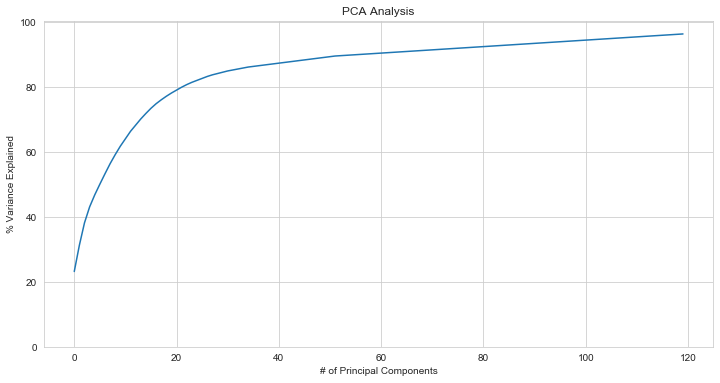

In [160]:
covar_matrix = PCA(n_components=120)
covar_matrix.fit(X_train_df)
variance = covar_matrix.explained_variance_ratio_

var=np.cumsum(np.round(variance, 3)*100)
plt.figure(figsize=(12,6))
plt.ylabel('% Variance Explained')
plt.xlabel('# of Principal Components')
plt.title('PCA Analysis')
plt.ylim(0,100.5)
plt.plot(var)

In [161]:
columns = ['pca' + str(x) for x in range(1,121)]

pca = PCA(n_components=120)
pca.fit(X_train_df)
X_train_pca = pca.transform(X_train_df)
X_test_pca = pca.transform(X_test_df)
X_train = pd.DataFrame(X_train_pca, columns=columns)
X_test = pd.DataFrame(X_test_pca, columns=columns)
print(pca.explained_variance_ratio_)      



[0.2322816  0.08109039 0.06880358 0.04929748 0.03722961 0.03307313
 0.03200659 0.03091224 0.02785492 0.02557779 0.0233343  0.02251304
 0.01940179 0.01898128 0.01684687 0.01576466 0.01378717 0.01209179
 0.01137704 0.01018554 0.00949052 0.00856412 0.00812277 0.00719617
 0.00633488 0.00605144 0.0058285  0.00490563 0.0043341  0.00398668
 0.00385911 0.0033485  0.00323662 0.00306748 0.00270564 0.00243923
 0.00227819 0.00217633 0.00205746 0.001969   0.00196108 0.00187134
 0.00184978 0.00179719 0.00178278 0.00175464 0.00171592 0.00162231
 0.00160691 0.00158468 0.00155081 0.00153096 0.00149139 0.00146249
 0.00142556 0.00141137 0.00140741 0.00135635 0.00132628 0.00131041
 0.00128697 0.0012742  0.00125534 0.00120332 0.00118401 0.00116613
 0.00115827 0.0011288  0.00109472 0.00109172 0.00107937 0.00104561
 0.00103954 0.00103024 0.00099926 0.00099542 0.00099498 0.00097827
 0.00097657 0.00095362 0.00094013 0.00092877 0.00091964 0.00090164
 0.00089391 0.00088439 0.0008719  0.00086274 0.00083866 0.0008

In [162]:
len(X_train.columns), len(X_test.columns)

(120, 120)

Once we created polynomial features and one-hot encoded our data, we ended up with over 1,300 features!  In order to reduce the overall training time and model complexity we applied PCA.  Producing 120 principal components allowed us to retain almost 100% of the variance in the original 1,300 features.  

## <font color='orange'>Training Models</font>

### Scoring Metric (RMSE)
For this competition we were informed the RMSE or the square root mean square error metric will be used to score our predictions.  The RMSE is the standard deviation of the errors or residuals in your model.  The residuals are the difference between the predicted value and the actual value. Once all the residuals have been calculated we then square each residual in order to transform negative residuals and take a grand mean of all the residuals.  The last step is to take the square root of that mean.

Since we have squared the residuals, large residuals are given a higher weight and therefore, RMSE is a good metric to use when very large residuals are especially undesirable. 

Lastly, the smaller the RMSE the better. 

In [164]:
kfolds = KFold(n_splits=10, shuffle=True, random_state=42)

def rmse_cross_validation(model):
    rmse = np.sqrt(-cross_val_score(model, X_train, y_train, scoring="neg_mean_squared_error", cv = kfolds))
    return(rmse)

def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

**Lasso Regression**: Very similar to Ridge regression as it too applies a penalty (L1 regularization) to overcome overfitting. However, the penalty can eventually reduce the coefficients to zero, thereby, eliminating them from the model.  Ridge regression on the other hand will reduce the size of the coefficients but they will never equal zero. Lasso regression is a great technique when you have thousands of features with limited colinearity as the penalty will remove irrelevant features.  However, if you have many features correlated with each other Lasso regression will potentially remove features which will lead to information loss and a lower accuracy model.  Lasso regression tends to work well when you have only a few very predictive features and many all but irrelavent features. 

**Elastic Net Regression**: Is the combination of L1 and L2 regularization. Elastic regression has one alpha hyper-parameter which is a ratio of L1 and L2 regularization which we need to set. If we set our alpha to 0 the elastic regression will become a ridge regression and if we set our alpha to 1 it becomes lasso regression.  Therefore, any value between 0 and 1 will give us a combination of ridge and lasso regression.   

**XGBoost**: Is a decision tree-based ensemble implementation utilizing gradient boosting. It is specifically designed for speed and high model performance.  

### Lasso Regression

In [165]:
lasso = Lasso(max_iter=500000)
kfolds = KFold(n_splits=5, shuffle=True, random_state=42)
params = {'alpha':np.linspace(0.000001, 0.01)}

lasso_cv = GridSearchCV(estimator = lasso,
                        param_grid = params, 
                        refit=True,
                        cv = kfolds, 
                        return_train_score = True,
                        verbose = 1,
                       n_jobs=-1)

lasso_cv.fit(X_train, y_train)
print('Best Alpha value: {}'.format(lasso_cv.best_params_))

Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    2.8s


Best Alpha value: {'alpha': 0.0014294285714285715}


[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:    3.5s finished


In [167]:
# Lasso Regression with Optimized Alpha
lasso = Lasso(max_iter = 10000, alpha = 0.0014294285714285715)
lasso.fit(X_train, y_train)
y_pred_lasso = lasso.predict(X_train)
print('Lasso CV RMSE: {}'.format(rmse_cross_validation(lasso).mean()))


Lasso CV RMSE: 0.06697207019525778


Lasso picked 91 features and eliminated the other 29 features


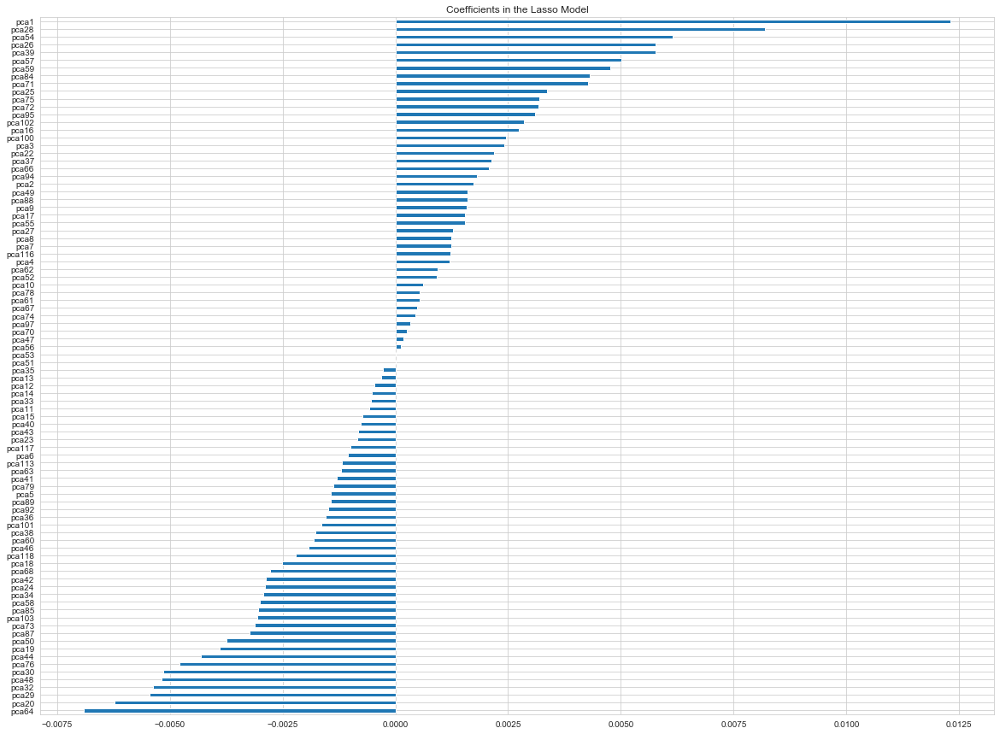

In [168]:
# Plot important coefficients
coefs = pd.Series(lasso.coef_, index = X_train.columns)
print("Lasso picked " + str(sum(coefs != 0)) + " features and eliminated the other " +  str(sum(coefs == 0)) + " features")
imp_coefs = pd.concat([coefs.sort_values().head(45),
                     coefs.sort_values().tail(45)])

plt.figure(figsize=(20,15))
imp_coefs.plot(kind = "barh")
plt.title("Coefficients in the Lasso Model")

plt.show()

## Support Vector Regression

In [198]:
svr = svm.SVR()
kfolds = KFold(n_splits=5, shuffle=True, random_state=42)
params = {'kernel': ['rbf', 'poly'], 
          'gamma': [1e-4, 1e-3, 0.01, 0.1, 0.2, 0.5, 0.6, 0.9],
          'C': [0.01, 0.1, 1, 10]}

svr_cv = GridSearchCV(estimator = svr,
                       param_grid = params,
                       refit=True,
                       cv = kfolds,
                       return_train_score = True,
                       verbose = 1,
                       n_jobs=-1)

svr_cv.fit(X_train, y_train.values.ravel())
print('Best Alpha value: {}'.format(svr_cv.best_params_))

Fitting 5 folds for each of 64 candidates, totalling 320 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    4.4s


Best Alpha value: {'C': 1, 'gamma': 0.0001, 'kernel': 'rbf'}


[Parallel(n_jobs=-1)]: Done 320 out of 320 | elapsed:    7.8s finished


In [229]:
svr = svm.SVR(kernel='rbf', gamma=0.0001, C=1)
svr.fit(X_train, y_train.values.ravel())
y_pred_svr = svr.predict(X_train)
print('SVR CV RMSE: {}'.format(rmse_cross_validation(svr).mean()))

/Users/kamilmysiak/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
/Users/kamilmysiak/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
/Users/kamilmysiak/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
/Users/kamilmysiak/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change t

SVR CV RMSE: 0.07365886759463189


/Users/kamilmysiak/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


## ElasticNet

In [169]:
eNet = ElasticNet(max_iter=1000000)

kfolds = KFold(n_splits=5, shuffle=True, random_state=42)
params = {'alpha': [0.0009,0.001,0.002, 0.003, 0.0035]}

eNet_cv = GridSearchCV(estimator = eNet,
                       param_grid = params,
                       refit=True,
                       cv = kfolds,
                       return_train_score = True,
                       verbose = 1,
                       n_jobs=-1)

eNet_cv.fit(X_train, y_train)
print('Best Alpha value: {}'.format(eNet_cv.best_params_))

Fitting 5 folds for each of 5 candidates, totalling 25 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Best Alpha value: {'alpha': 0.003}


[Parallel(n_jobs=-1)]: Done  25 out of  25 | elapsed:    2.9s finished


In [170]:
# ElasticNet with Optimized Hyper-parameters
Enet = ElasticNet(alpha=0.003, max_iter=100000)
Enet.fit(X_train, y_train)
y_pred_Enet = Enet.predict(X_train)
print('ElasticNet CV RMSE: {}'.format(rmse_cross_validation(Enet).mean()))

ElasticNet CV RMSE: 0.06697617964456073


ElasticNet picked 91 features and eliminated the other 29 features


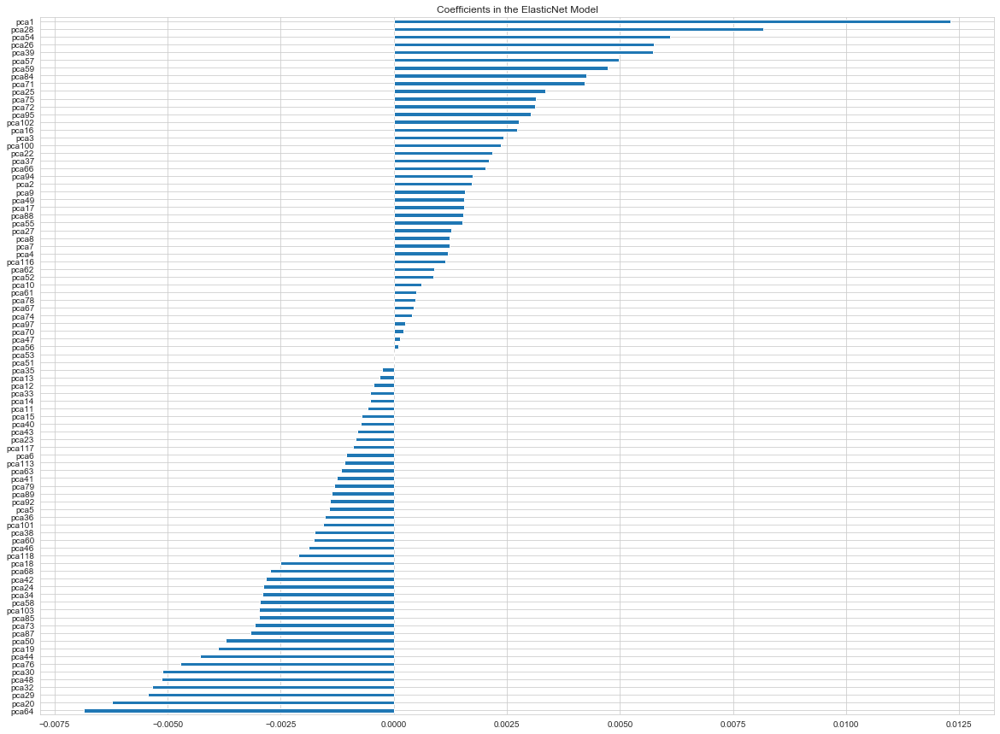

In [171]:
# Plot important coefficients
coefs = pd.Series(Enet.coef_, index = X_train.columns)
print("ElasticNet picked " + str(sum(coefs != 0)) + " features and eliminated the other " +  str(sum(coefs == 0)) + " features")

plt.figure(figsize=(20,15))
imp_coefs = pd.concat([coefs.sort_values().head(45),
                     coefs.sort_values().tail(45)])
imp_coefs.plot(kind = "barh")
plt.title("Coefficients in the ElasticNet Model")
plt.show()

## XGBoost

In [172]:
xgboost = XGBRegressor(objective="reg:squarederror", n_estimators= 1000)
kfolds = KFold(n_splits=5, shuffle=True, random_state=42)
params = {'colsample_bytree' :[0.8],
          'learning_rate': [0.2,0.3,0.04, 0.05, ],
          'min_child_weight': [3,4],
          'subsample': [0.8],
          'max_depth': [3,],
         'reg_alpha': [00.2, 0.3],
          'reg_lambda': [0.2, 0.3],
         'gamma': [0]}

xgboost_cv = GridSearchCV(estimator = xgboost,
                       param_grid = params,
                       refit=True,
                       cv = kfolds, 
                          scoring='neg_root_mean_squared_error',
                       return_train_score = True,
                       verbose = 1,
                       n_jobs=-1)

xgboost_cv.fit(X_train, y_train)

print('Best Parameters value: {}'.format(xgboost_cv.best_params_))
print(xgboost_cv.cv_results_)

Fitting 5 folds for each of 32 candidates, totalling 160 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   37.4s
[Parallel(n_jobs=-1)]: Done 160 out of 160 | elapsed:  3.2min finished


Best Parameters value: {'colsample_bytree': 0.8, 'gamma': 0, 'learning_rate': 0.05, 'max_depth': 3, 'min_child_weight': 3, 'reg_alpha': 0.3, 'reg_lambda': 0.3, 'subsample': 0.8}
{'mean_fit_time': array([11.01371703, 10.9090435 , 12.07245154, 13.12895579, 13.22215953,
       12.53380146, 12.18908701, 12.94068031, 11.84140954, 11.90462976,
       12.02495575, 12.0600986 , 11.33328862, 11.22397709, 10.49111056,
       10.15670028, 14.91010146, 14.96235933, 15.11490827, 14.9716238 ,
       15.07189569, 15.36314392, 15.71591034, 15.94587684, 17.40100474,
       17.60538306, 16.87950735, 16.58901582, 16.27214131, 16.03179359,
       15.07206731, 10.44019456]), 'std_fit_time': array([0.18593675, 0.20294641, 1.12651234, 0.16213228, 0.41909602,
       0.1465629 , 0.12521916, 0.33380422, 0.14910076, 0.23819623,
       0.11626172, 0.12202262, 0.11261885, 0.14166886, 0.40266932,
       0.15939551, 0.09403471, 0.07770069, 0.23835871, 0.11814476,
       0.07602018, 0.17668299, 0.09739336, 0.13780639

In [174]:
xgboost = XGBRegressor(n_estimators = 3000, colsample_bytree = 0.8, 
                       gamma = 0.0,  reg_lambda = 0.3,  min_child_weight = 3,
                       reg_alpha = 0.3, learning_rate = 0.05, max_depth = 3, 
                       subsample = 0.8)
xgboost.fit(X_train, y_train)
y_pred_xgb = xgboost.predict(X_train)
print('XGBoost CV RMSE: {}'.format(rmse_cross_validation(xgboost).mean()))

XGBoost CV RMSE: 0.0727759300602024


## LightGBM

In [204]:
lightgbm = LGBMRegressor()
kfolds = KFold(n_splits=5, shuffle=True, random_state=42)
params = {'n_estimators': [400],
        'learning_rate': [0.001, 0.01],
        'colsample_bytree': [0.7, 0.8],
        'max_depth': [4,5,6],
        'num_leaves': [10, 20],
        'reg_alpha': [0.9, 1.1, 1.2],
        'reg_lambda': [1.2, 1.5],
        'min_split_gain': [0.1, 0.2, 0.3],
        'subsample': [0.8, 0.9],
        'subsample_freq': [10, 20]}

lightgbm_cv = GridSearchCV(estimator = lightgbm,
                       param_grid = params,
                       refit=True,
                       cv = kfolds, 
                           scoring='neg_root_mean_squared_error',
                       return_train_score = True,
                       verbose = 1,
                       n_jobs=-1)

lightgbm_cv.fit(X_train, y_train)

print('Best Parameters value: {}'.format(lightgbm_cv.best_params_))
print(lightgbm_cv.cv_results_)

Fitting 5 folds for each of 1728 candidates, totalling 8640 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   18.6s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:   40.4s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 8640 out of 8640 | elapsed: 11.8min finished


Best Parameters value: {'colsample_bytree': 0.8, 'learning_rate': 0.01, 'max_depth': 5, 'min_split_gain': 0.1, 'n_estimators': 400, 'num_leaves': 10, 'reg_alpha': 0.9, 'reg_lambda': 1.2, 'subsample': 0.9, 'subsample_freq': 20}
{'mean_fit_time': array([0.95253015, 0.96457844, 1.0373631 , ..., 0.59999757, 0.61069722,
       0.51311231]), 'std_fit_time': array([0.02374894, 0.02341821, 0.02493068, ..., 0.02683381, 0.02809391,
       0.0359002 ]), 'mean_score_time': array([0.01572804, 0.01671858, 0.01648211, ..., 0.01265249, 0.01203866,
       0.00786505]), 'std_score_time': array([0.00136773, 0.00141673, 0.00205933, ..., 0.00075011, 0.00056224,
       0.00047826]), 'param_colsample_bytree': masked_array(data=[0.7, 0.7, 0.7, ..., 0.8, 0.8, 0.8],
             mask=[False, False, False, ..., False, False, False],
       fill_value='?',
            dtype=object), 'param_learning_rate': masked_array(data=[0.001, 0.001, 0.001, ..., 0.01, 0.01, 0.01],
             mask=[False, False, False, ..., 

In [205]:
lightgbm = LGBMRegressor(n_estimators=400, learning_rate=0.01, colsample_bytree=0.8, max_depth=5,
                        num_leaves=10, reg_alpha=0.9, reg_lambda=1.2, min_split_gain=0.1,
                        subsample=0.9, subsample_freq=20)
lightgbm.fit(X_train, y_train)
y_pred_lgbm = lightgbm.predict(X_train)
print('lightgbm CV RMSE: {}'.format(rmse_cross_validation(lightgbm).mean()))

lightgbm CV RMSE: 0.09163769540513199


## <font color='orange'>Voting Ensemble</font>
Using the VotingRegressor library we made our prediction using the average of our regression models (ie. lasso, elastic net and XGBoost).  Our RMSE dropped to 4% from an average of 7% for each individual model.  Interesting enough, when we added SVR and LightGBM our model's accuracy decreased.  

In [207]:
from sklearn.ensemble import VotingRegressor

vote_mod = VotingRegressor([('lasso', lasso), ('Enet', Enet), 
                            ('XGBRegressor', xgboost)])
vote = vote_mod.fit(X_train, y_train.values.ravel())
vote_pred = vote.predict(X_train)

print('Root Mean Square Error test: {}'.format(rmse(y_train, vote_pred)))

Root Mean Square Error test: 0.04322898356575668


## <font color='orange'>Stacking Models</font>
Model stacking is an ensemble technique which utilizes individual models where the prediction builds one model on top of the other.  

In [256]:
stack = StackingRegressor(regressors=[xgboost, lasso, Enet, vote], 
                          meta_regressor=vote, 
                          use_features_in_secondary=True,
                          store_train_meta_features=True)

stack_model = stack.fit(X_train, y_train.values.ravel())
stack_pred = stack_model.predict(X_train)
print('Root Mean Square Error train: {}'.format(rmse(y_train, stack_pred)))

Root Mean Square Error train: 0.020442274048013805


In [68]:
inv_boxcox(9.488371, -0.04362228148170884)

#-0.04362228148170884

208499.89266013406

## <font color='orange'>Submission</font>

In [249]:
test_stack_pred = stack_model.predict(X_test)
submission = inv_boxcox(test_stack_pred, -0.04362228148170884)

In [250]:
submission

array([126931.89967862, 160933.32293897, 178565.98187934, ...,
       173774.04351481, 120031.87655641, 208805.80176433])

In [251]:
final_submission = pd.DataFrame({'Id': test_id, 'SalePrice': submission})
final_submission.head()

,Id,SalePrice
0,1461,126931.899679
1,1462,160933.322939
2,1463,178565.981879
3,1464,202773.679366
4,1465,176257.833814


In [252]:
final_submission.to_csv("final_submission5.csv", index=False)

# Testing Disregard

### Dropping outliers

In [ ]:
def outlier_treatment(feature):
    sorted(feature)
    q1,q3 = np.percentile(feature , [25,75])
    IQR = q3 - q1
    lower_range = q1 - (1.5 * IQR)
    upper_range = q3 + (1.5 * IQR)
    return lower_range,upper_range

In [ ]:
outlier_treatment(train['OverallQual'])
lower_range, upper_range = outlier_treatment(train['OverallQual'])

overall_qual_drop = train[(train['OverallQual'] < lower_range) 
                                         | (train['OverallQual'] > upper_range)]
print('Number of outliers: {}'.format(len(overall_qual_drop)))

In [ ]:
test.drop(overall_qual_drop.index, axis=0, inplace=True)

### Calculating new features based on saleprice

In [ ]:
neigh_train_mappings = {'Blmngtn':194870.882353, 'Blueste':137500.000000, 'BrDale':104493.750000, 
           'BrkSide':126334.649123, 'ClearCr':213012.296296, 'CollgCr':195175.851351,
           'Crawfor':201807.520833, 'Edwards':128002.268041, 'Gilbert':192854.506329, 
           'IDOTRR':100123.783784, 'MeadowV':98576.470588, 'Mitchel':156270.122449,
           'NAmes':144115.283784, 'NPkVill':142694.444444, 'NWAmes':185412.214286, 
           'NoRidge':296730.545455, 'NridgHt':306869.726027, 'OldTown':120536.321101, 
           'SWISU':137729.739130, 'Sawyer':136793.135135, 'SawyerW':182206.877193, 
           'Somerst':225379.837209,  'StoneBr':283141.545455, 'Timber':241037.918919, 
           'Veenker':238772.727273}
train['avg_neighbor_price'] = train['Neighborhood'].map(neigh_train_mappings)


cond1_mappings = {'Artery':121097.777778, 'Feedr':141525.493671, 'Norm':179462.222132, 
                  'PosA':225875.000000, 'PosN':211859.375000, 'RRAe':138400.000000, 
                  'RRAn':181772.480000, 'RRNe':190750.000000,'RRNn':212400.000000}
train['avg_condition1_price'] = train['Condition1'].map(cond1_mappings)


overallqual_mappings = {2:51770.333333, 3:87473.750000, 4:108420.655172, 5:133354.214646, 
                        6:160947.533693, 7:206001.823718, 8:267148.051948, 
                        9:349871.868421, 10:418606.100000}
train['avg_overallqual_price'] = train['OverallQual'].map(overallqual_mappings)

### Hyperopt

In [ ]:
def lgb_rmse_cv(params, random_state=42, cv=kfolds, X=X_train, y=y_train):
    # the function gets a set of variable parameters in "param"
    params = {'n_estimators': int(params['n_estimators']), 
              'max_depth': int(params['max_depth']), 
              'min_child_weight': int(params['min_child_weight']),
              'colsample_bytree': params['colsample_bytree'],
              'subsample': params['subsample']}
    
    # we use this params to create a new LGBM Regressor
    model = LGBMRegressor(random_state=42, learning_rate=0.5, **params)
    
    # and then conduct the cross validation with the same folds as before
    score = np.sqrt(-cross_val_score(model, X, y, cv=kfolds, scoring="neg_mean_squared_error", n_jobs=-1)).mean()

    return score

In [ ]:
%%time

# possible values of parameters
space = {'n_estimators': 100,
         'max_depth': hp.choice('max_depth', np.arange(5, 16, 1)),
         'min_child_weight': hp.choice('min_child_weight', np.arange(1, 8, 1)),
         'colsample_bytree': hp.choice('colsample_bytree', np.arange(0.3, 0.8, 0.1)),
         'subsample': hp.uniform('subsample', 0.8, 1)}

# trials will contain logging information
trials = Trials()

best = fmin(fn=lgb_rmse_cv, # function to optimize
          space=space, 
          algo=tpe.suggest, # optimization algorithm, hyperotp will select its parameters automatically
          max_evals=50, # maximum number of iterations
          trials=trials, # logging
          rstate=np.random.RandomState(42) # fixing random state for the reproducibility
         )


In [ ]:
print('Best parameters {}'.format(best))

In [ ]:
# computing the score on the train set
model = LGBMRegressor(random_state=42, 
                     
                      max_depth=int(best['max_depth']),
                      min_child_weight=int(best['min_child_weight']),
                      colsample_bytree=best['colsample_bytree'],
                      subsample=best['subsample'])
model.fit(X_train,y_train)
tpe_train_score = sqrt(mean_squared_error(y_train, model.predict(X_train)))

print("Best RMSE {:.3f} params {}".format(lgb_rmse_cv(best), best))


In [ ]:
lgbm = LGBMRegressor(n_estimators = 100, learning_rate = 0.05, max_depth = 4,
                    colsample_bytree = 4, min_child_weight = 3, subsample = 0.8970398135042864)
lgbm.fit(X_train, y_train)
y_pred_lgbm = lgbm.predict(X_train)
print('LGBoost CV RMSE: {}'.format(rmse_cross_validation(lgbm).mean()))